#### Step 1 导入相关包

In [1]:
from tqdm import tqdm
from collections import defaultdict,Counter
import matplotlib.pyplot as plt
import pickle
import numpy as np
import networkx as nx
import csv
import seaborn as sns
import pandas as pd

from scipy import stats
import re

# 设置全局字体为 Times New Roman
plt.rcParams['font.family'] = 'SimSun'

#### Step 2 加载数据

In [14]:
with open('./data/filter_ai_papers_0312.pkl', 'rb') as f:
    filter_ai_papers = pickle.load(f)

In [2]:
# 保存合并后的结果到新的文件
with open('./data/cso_result_merged.pkl', 'rb') as f:
    cso_result = pickle.load(f)

In [4]:
with open('./data/yearly_cso_coreness_0501.pickle', 'rb') as f:
    yearly_cso_coreness = pickle.load(f)

In [13]:
yearly_cso_coreness[2024]['coreness']

{'private information': 1,
 'recommender systems': 1,
 'deep learning': 1,
 'personal information': 1,
 'privacy preserving': 1,
 'user information': 1,
 'user interfaces': 1,
 'generative ai': 1,
 'large language models': 1,
 'genetic analysis': 1,
 'genetic selection': 1,
 'speech recognition': 1,
 'natural language processing': 1,
 'language model': 1,
 'personalizations': 1,
 'e-commerce': 1,
 'user experience': 1,
 'human engineering': 1,
 'microprocessor chips': 1,
 'single event upsets': 1,
 'fault tolerance': 1,
 'computer science': 1,
 'computer aided design': 1,
 'soft error': 1,
 'computer hardware': 1,
 'machine learning': 0,
 'area overhead': 1,
 'embedded systems': 1,
 'programmable logic controllers': 1,
 'neural networks': 1,
 'integrated circuits': 1,
 'low power': 1,
 'application specific integrated circuits': 1,
 'routers': 1,
 'classification label': 1,
 'classification': 1,
 'data mining': 1,
 'convolutional neural networks': 1,
 'computer systems': 1,
 'static ra

In [5]:
core_entities = defaultdict(list)  # 用于存储每年的核心实体
for publication_year in yearly_cso_coreness.keys():
    coreness_data = yearly_cso_coreness.get(publication_year, {})
    core_entities_list = [entity for entity, is_core in coreness_data.get('coreness', {}).items() if is_core == 1]
    core_entities[publication_year].extend(core_entities_list)

#### Step 3 绘制图像

In [6]:
# 遍历每篇论文，计算其包含的核心实体数量
for record_id, record in tqdm(filter_ai_papers.items()):
    publication_year = record.get("publication_year", 0)

    if publication_year < 1980:
        continue

    # 获取该论文的实体列表
    if record_id in cso_result and 'explanation' in cso_result[record_id]:
        entity_lists = list(cso_result[record_id]['explanation'].keys())

        # 获取该年份的核心实体列表
        current_core_entities = core_entities.get(publication_year, [])

        # 计算交集，得到该论文中的核心实体
        paper_core_entities = [entity for entity in entity_lists if entity in current_core_entities]

        # 记录核心实体的数量
        record['core_entity_count'] = len(paper_core_entities)
        # 记录实体的数量
        record['entity_count'] = len(entity_lists)
        # 如果需要，也可以记录具体的核心实体
        record['core_entities'] = paper_core_entities

100%|██████████| 1377520/1377520 [03:25<00:00, 6695.10it/s]


In [14]:
import matplotlib.font_manager as fm
# 定义中文字体和英文字体
simsun_font = fm.FontProperties(fname='simsum.ttc')  # SimSun 字体文

100%|██████████| 1377520/1377520 [00:01<00:00, 1343795.23it/s]


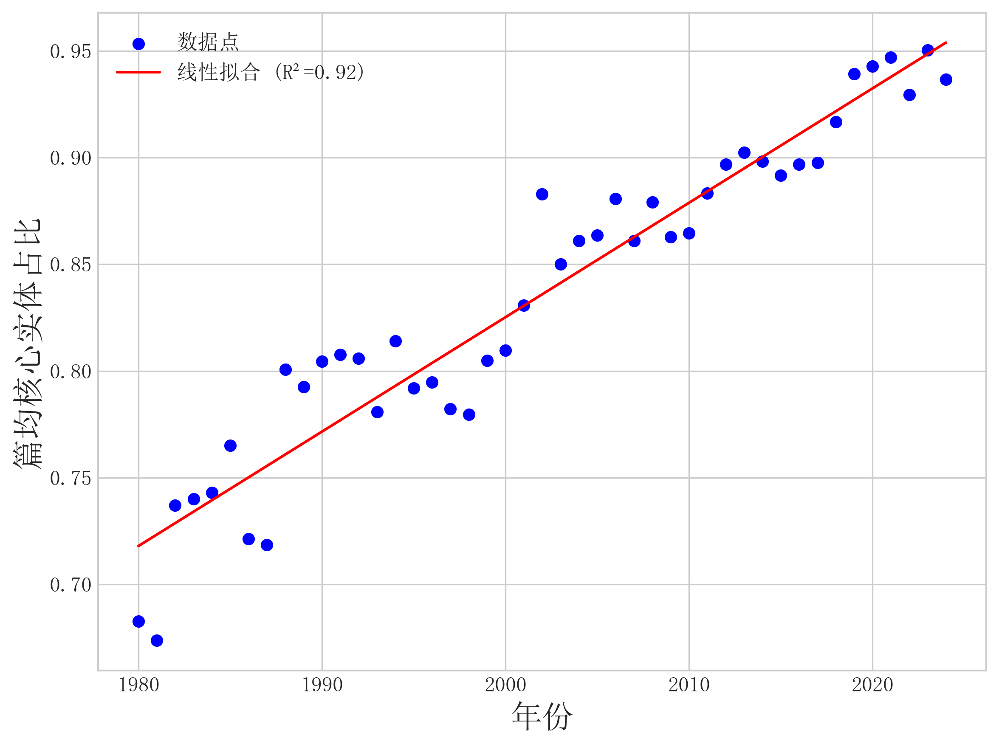

In [47]:
# 创建数据存储结构
yearly_peripheral_stats = defaultdict(lambda: {'total_papers': 0, 'total_peripheral_entities': 0, 'total_entities': 0})

# 数据处理逻辑
for record_id, record in tqdm(filter_ai_papers.items()):
    publication_year = record.get("publication_year", 0)
    
    if publication_year < 1980:
        continue

    core_entity_count = record.get('core_entity_count', 0)
    entity_count = record.get('entity_count', 0)

    if entity_count > 0:
        peripheral_entity_count = entity_count - core_entity_count
        
        yearly_peripheral_stats[publication_year]['total_papers'] += 1
        yearly_peripheral_stats[publication_year]['total_peripheral_entities'] += peripheral_entity_count
        yearly_peripheral_stats[publication_year]['total_entities'] += entity_count

# 提取数据用于绘图
years = []
peripheral_ratios = []
for year in sorted(yearly_peripheral_stats.keys()):
    total_entities = yearly_peripheral_stats[year]['total_entities']
    total_peripheral = yearly_peripheral_stats[year]['total_peripheral_entities']
    
    if total_entities > 0:
        core_ratio = 1 - total_peripheral / total_entities
        years.append(year)
        peripheral_ratios.append(core_ratio)

# 创建DataFrame
df = pd.DataFrame({
    'Year': years,
    'Peripheral Entity Ratio': peripheral_ratios
})

# 执行线性回归分析
slope, intercept, r_value, p_value, std_err = stats.linregress(years, peripheral_ratios)
fit_line = slope * np.array(years) + intercept

# 绘制散点图和拟合直线
plt.figure(figsize=(8, 6),dpi=300)
plt.scatter(years, peripheral_ratios, color='b', label='数据点')
plt.plot(years, fit_line, color='r', label=f'线性拟合 (R²={r_value**2:.2f})')

# 添加标签和标题
plt.xlabel('年份', fontsize=18)
plt.ylabel('篇均核心实体占比', fontsize=18)
plt.legend()
# plt.grid(True)
plt.tight_layout()
plt.show()

100%|██████████| 1377520/1377520 [00:00<00:00, 1546688.71it/s]


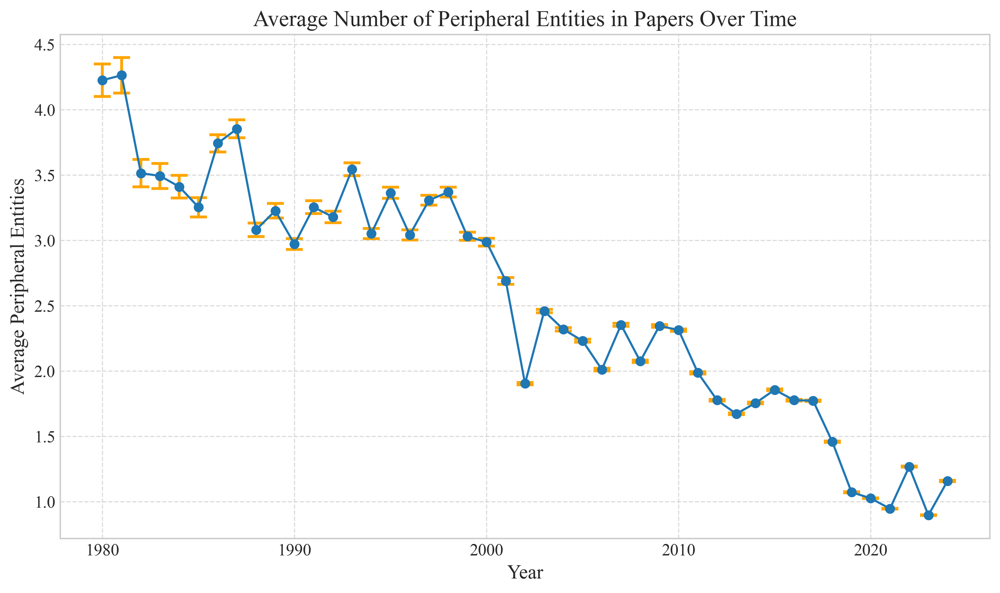

In [9]:
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
from collections import defaultdict
import numpy as np
from scipy import stats

# 创建字典来存储每年的统计信息
yearly_peripheral_stats = defaultdict(lambda: {
    'total_papers': 0,
    'peripheral_entities_list': []  # 存储每篇论文的边缘实体数量
})

# 遍历每篇论文，计算其包含的边缘实体数量
for record_id, record in tqdm(filter_ai_papers.items()):
    publication_year = record.get("publication_year", 0)

    if publication_year < 1980:
        continue

    core_entity_count = record.get('core_entity_count', 0)
    entity_count = record.get('entity_count', 0)

    if entity_count > 0:
        peripheral_entity_count = entity_count - core_entity_count
        yearly_peripheral_stats[publication_year]['total_papers'] += 1
        yearly_peripheral_stats[publication_year]['peripheral_entities_list'].append(peripheral_entity_count)

# 提取数据用于绘图
years = []
avg_peripheral_entities = []
sem_peripheral_entities = []  # 标准误

for year in sorted(yearly_peripheral_stats.keys()):
    peripheral_entities_list = yearly_peripheral_stats[year]['peripheral_entities_list']
    if len(peripheral_entities_list) > 0:
        avg_peripheral = np.mean(peripheral_entities_list)
        # 计算标准误
        sem = np.std(peripheral_entities_list, ddof=1) / np.sqrt(len(peripheral_entities_list))
        years.append(year)
        avg_peripheral_entities.append(avg_peripheral)
        sem_peripheral_entities.append(sem)

# 创建数据框用于绘图
df = pd.DataFrame({
    'Year': years,
    'Average Peripheral Entities': avg_peripheral_entities,
    'SEM': sem_peripheral_entities  # 标准误
})

# 绘制平均边缘实体数量随年份变化的折线图
plt.figure(figsize=(10, 6), dpi=300)
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 12

# 绘制折线图并添加误差线
plt.errorbar(df['Year'], df['Average Peripheral Entities'], yerr=df['SEM'], fmt='-o', 
             color='#1f77b4', ecolor='orange', elinewidth=2, capsize=6, capthick=2)

# 添加标签和标题
plt.title('Average Number of Peripheral Entities in Papers Over Time', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average Peripheral Entities', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# 添加网格线
plt.grid(True, linestyle='--', alpha=0.7)


# 显示图形
plt.tight_layout()
plt.show()

In [22]:
def classify_institution_type(authorships):
    academic_types = {'education', 'healthcare'}
    industry_types = {'company'}

    has_academic = False
    has_industry = False

    for authorship in authorships:
        institution_type = authorship.get('institution_type', 'unknown')
        if institution_type in academic_types:
            has_academic = True
        elif institution_type in industry_types:
            has_industry = True

    if has_academic and has_industry:
        return 'cooperation'
    elif has_academic:
        return 'academic'
    elif has_industry:
        return 'industry'
    else:
        return 'other'

for record_id, record in tqdm(filter_ai_papers.items()):
    authorships = record.get('authorships', [])
    category = classify_institution_type(authorships)
    record['category'] = category

100%|██████████| 1377520/1377520 [00:01<00:00, 1083905.90it/s]


100%|██████████| 1377520/1377520 [00:00<00:00, 2063910.41it/s]


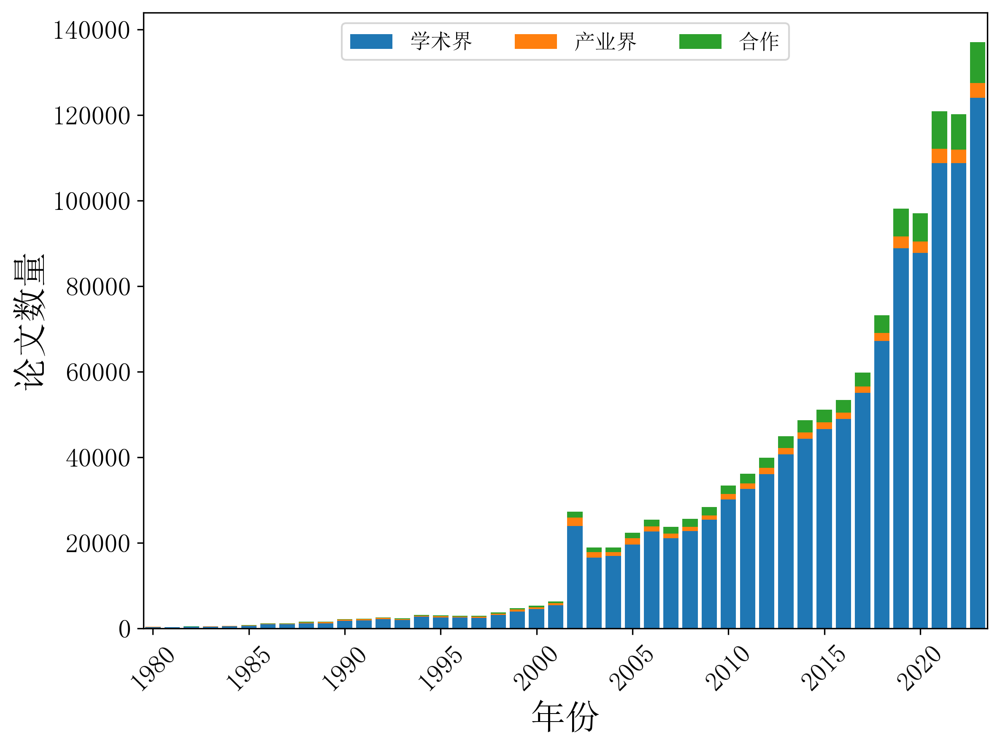

In [26]:
# 初始化统计字典
category_distribution_by_year = defaultdict(lambda: defaultdict(int))

# 遍历每篇论文
for record_id, record in tqdm(filter_ai_papers.items()):
    publication_year = record.get("publication_year", 0)
    if publication_year < 1980 or publication_year >= 2024:
        continue

    # 将分类结果存储回 ai_papers 数据结构中
    category = record['category']

    # 统计每年每种分类的数量
    category_distribution_by_year[publication_year][category] += 1

# 准备绘图数据
years = sorted(category_distribution_by_year.keys())
categories = ['academic', 'industry', 'cooperation']

# 初始化每年每种分类的数量列表
category_counts = {cat: [] for cat in categories}

# 填充数据
for year in years:
    total_papers = sum(category_distribution_by_year[year].values())
    for category in categories:
        count = category_distribution_by_year[year][category]
        category_counts[category].append(count)

# 绘制堆叠图
plt.figure(figsize=(8, 6),dpi=300)
bottoms = [0] * len(years)  # 初始化堆叠的底部位置

legend_labels = {'academic': '学术界', 'industry': '产业界', 'cooperation': '合作'}

for category in categories:
    plt.bar(years, category_counts[category], bottom=bottoms, label=legend_labels.get(category, category.capitalize()))
    bottoms = [bottoms[i] + category_counts[category][i] for i in range(len(years))]

plt.xlim(min(years)-0.5, max(years)+.5)

plt.xlabel('年份',fontsize=20)
plt.ylabel('论文数量',fontsize=20)
plt.xticks(years[::5], rotation=45, fontsize=15)
plt.yticks(fontsize=15)  # 设置纵坐标字体大小

# 设置图例居中
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.0), ncol=len(categories), fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

100%|██████████| 1377520/1377520 [00:00<00:00, 1899899.75it/s]
C:\Users\Administrator\AppData\Local\Temp\ipykernel_9512\870450390.py:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = cm.get_cmap('tab20c')


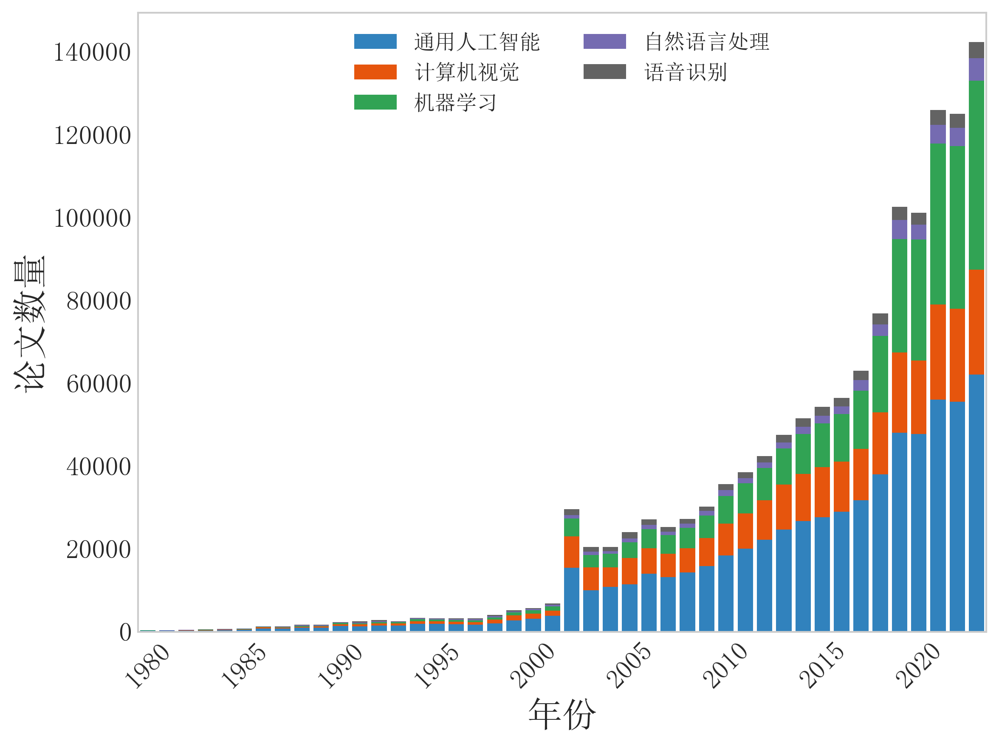

In [48]:
from collections import defaultdict
import matplotlib.pyplot as plt
from tqdm import tqdm

# 创建字典来存储每年每个 sub_concept 的论文数量
yearly_subconcept_counts = defaultdict(lambda: defaultdict(int))

# 遍历每篇论文并统计 sub_concept
for record_id, record in tqdm(filter_ai_papers.items()):
    publication_year = record.get("publication_year", 0)
    
    if publication_year < 1980 or publication_year>=2024:
        continue

    sub_concept = record.get('sub concepts', [])
    yearly_subconcept_counts[publication_year][sub_concept[0]] += 1

# 提取数据用于绘图
years = sorted(yearly_subconcept_counts.keys())
subconcepts = set()
for year_data in yearly_subconcept_counts.values():
    subconcepts.update(year_data.keys())
subconcepts = sorted(subconcepts)

# 准备绘图数据
category_counts = {subconcept: [] for subconcept in subconcepts}
for year in years:
    for subconcept in subconcepts:
        category_counts[subconcept].append(yearly_subconcept_counts[year].get(subconcept, 0))

# 为每个 sub_concept 分配颜色
import matplotlib.cm as cm
color_map = cm.get_cmap('tab20c')
colors = {subconcept: color_map(i / len(subconcepts)) for i, subconcept in enumerate(subconcepts)}

# 绘制堆叠柱状图
plt.figure(figsize=(8, 6), dpi=300)
bottoms = [0] * len(years)

# 定义子概念到中文标签的映射
subconcept_labels = {
    'Artificial Intelligence': '通用人工智能',
    'Computer Vision': '计算机视觉',
    'Machine Learning': '机器学习',
    'Natural Language Processing': '自然语言处理',
    'Speech Recognition': '语音识别'
}

for subconcept in subconcepts:
    heights = category_counts[subconcept]
    plt.bar(years, heights, bottom=bottoms, label=subconcept_labels.get(subconcept, subconcept), color=colors[subconcept])
    bottoms = [b + h for b, h in zip(bottoms, heights)]

plt.xlim(min(years) - 0.5, max(years) + 0.5)

plt.xlabel('年份', fontsize=20)
plt.ylabel('论文数量', fontsize=20)
plt.xticks(years[::5], rotation=45, fontsize=15)
plt.yticks(fontsize=15)

# 设置图例为两列
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1), ncol=2, fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

100%|██████████| 1377520/1377520 [00:01<00:00, 1277368.08it/s]


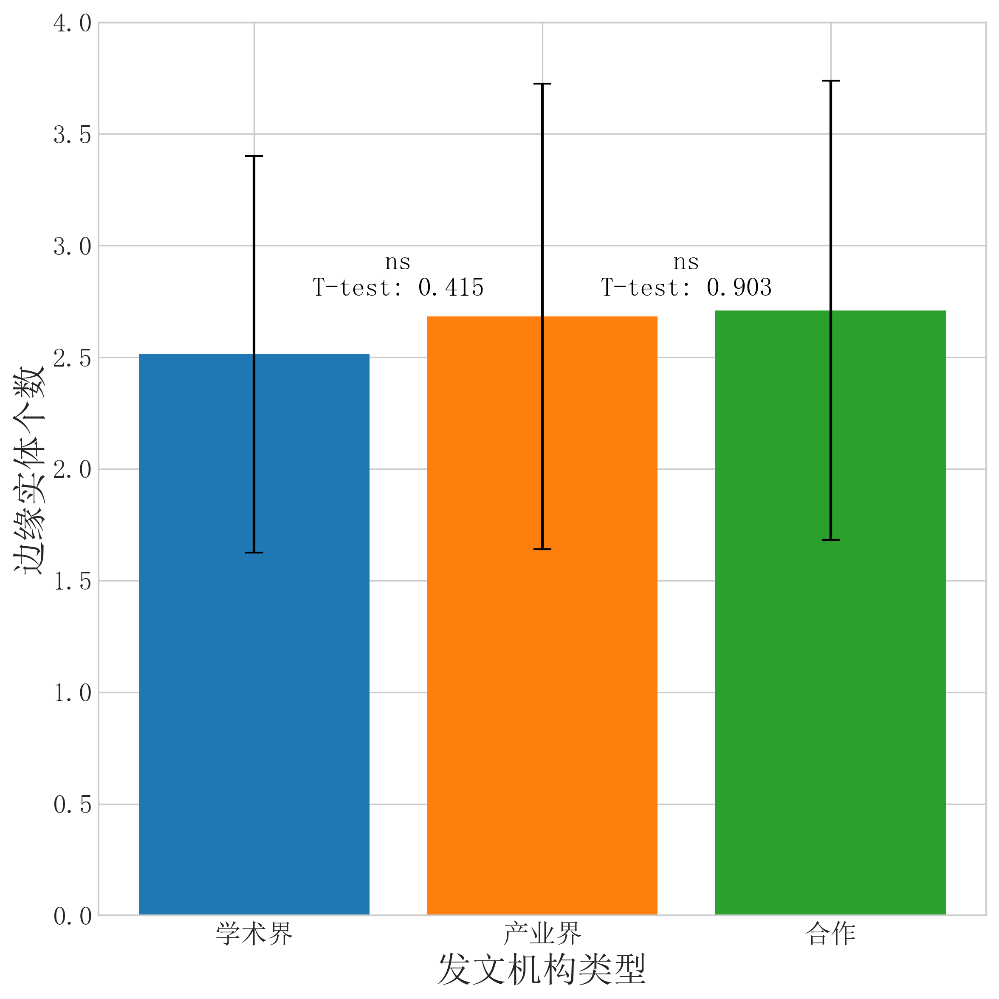

In [35]:
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
from collections import defaultdict
import numpy as np
from scipy import stats

# 创建字典来存储每年不同类型机构的统计信息
yearly_institution_entity_stats = defaultdict(lambda: {
    'academic': {'total_papers': 0, 'total_peripheral_entities': 0},
    'industry': {'total_papers': 0, 'total_peripheral_entities': 0},
    'cooperation': {'total_papers': 0, 'total_peripheral_entities': 0}
})

# 遍历每篇论文，按机构类型分类统计边缘实体数量
for record_id, record in tqdm(filter_ai_papers.items()):
    publication_year = record.get("publication_year", 0)

    if publication_year < 1980:
        continue

    category = record.get('category', 'other')
    if category not in ['academic', 'industry', 'cooperation']:
        continue

    core_entity_count = record.get('core_entity_count', 0)
    entity_count = record.get('entity_count', 0)

    if entity_count > 0:
        peripheral_entity_count = entity_count - core_entity_count

        if category == 'academic':
            yearly_institution_entity_stats[publication_year]['academic']['total_papers'] += 1
            yearly_institution_entity_stats[publication_year]['academic']['total_peripheral_entities'] += peripheral_entity_count
        elif category == 'industry':
            yearly_institution_entity_stats[publication_year]['industry']['total_papers'] += 1
            yearly_institution_entity_stats[publication_year]['industry']['total_peripheral_entities'] += peripheral_entity_count
        elif category == 'cooperation':
            yearly_institution_entity_stats[publication_year]['cooperation']['total_papers'] += 1
            yearly_institution_entity_stats[publication_year]['cooperation']['total_peripheral_entities'] += peripheral_entity_count

# 提取数据用于绘图和分析
academic_peripheral = []
industry_peripheral = []
cooperation_peripheral = []

for year in sorted(yearly_institution_entity_stats.keys()):
    academic_data = yearly_institution_entity_stats[year]['academic']
    industry_data = yearly_institution_entity_stats[year]['industry']
    cooperation_data = yearly_institution_entity_stats[year]['cooperation']

    if academic_data['total_papers'] > 0:
        academic_avg = academic_data['total_peripheral_entities'] / academic_data['total_papers']
        academic_peripheral.append(academic_avg)
    if industry_data['total_papers'] > 0:
        industry_avg = industry_data['total_peripheral_entities'] / industry_data['total_papers']
        industry_peripheral.append(industry_avg)
    if cooperation_data['total_papers'] > 0:
        cooperation_avg = cooperation_data['total_peripheral_entities'] / cooperation_data['total_papers']
        cooperation_peripheral.append(cooperation_avg)

# 创建数据框用于绘图
data = {
    'institution_type': ['学术界', '产业界', '合作'], 
    'mean': [np.mean(academic_peripheral), np.mean(industry_peripheral), np.mean(cooperation_peripheral)],
    'std': [np.std(academic_peripheral), np.std(industry_peripheral), np.std(cooperation_peripheral)]
}
df = pd.DataFrame(data)

# 设置绘图风格
plt.figure(figsize=(8, 8), dpi=300)
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'SimSun'
plt.rcParams['font.size'] = 12

# 设置自定义颜色配色方案
palette = ['#1f77b4', '#ff7f0e', '#2ca02c']

# 绘制柱状图并添加误差线
bars = plt.bar(df['institution_type'], df['mean'], yerr=df['std'], color=palette, capsize=5)

# 添加显著性星号
def get_significance(p_val):
    if p_val < 0.01:
        return '**'
    elif p_val < 0.05:
        return '*'
    else:
        return 'ns'

# 准备 t 检验的数据
academic = np.array(academic_peripheral)
industry = np.array(industry_peripheral)
cooperation = np.array(cooperation_peripheral)

# 进行 t 检验
t_stat_1_2, p_val_1_2 = stats.ttest_ind(academic, industry, nan_policy='omit')
t_stat_2_3, p_val_2_3 = stats.ttest_ind(industry, cooperation, nan_policy='omit')

# 获取y轴的最大值，留白空间
y_max = max(df['mean'] + df['std']) + 0.02  # 增加一些顶部空间

# 添加显著性标注
plt.text(0.5, y_max-1, f'{get_significance(p_val_1_2)}\nT-test: {p_val_1_2:.3f}', ha='center', va='bottom', fontsize=15, color='black')
plt.text(1.5, y_max-1, f'{get_significance(p_val_2_3)}\nT-test: {p_val_2_3:.3f}', ha='center', va='bottom', fontsize=15, color='black')

# 添加标签和标题
plt.xlabel('发文机构类型', fontsize=20)
plt.ylabel('边缘实体个数', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

# 设置y轴范围
plt.ylim(0, 4)  # 根据数据自动调整上限

# 添加图例
# plt.legend(['Data Points', 'Average'], loc='upper right', fontsize=12)

# 显示图形
plt.tight_layout()
plt.show()

100%|██████████| 1377520/1377520 [00:00<00:00, 1514739.14it/s]


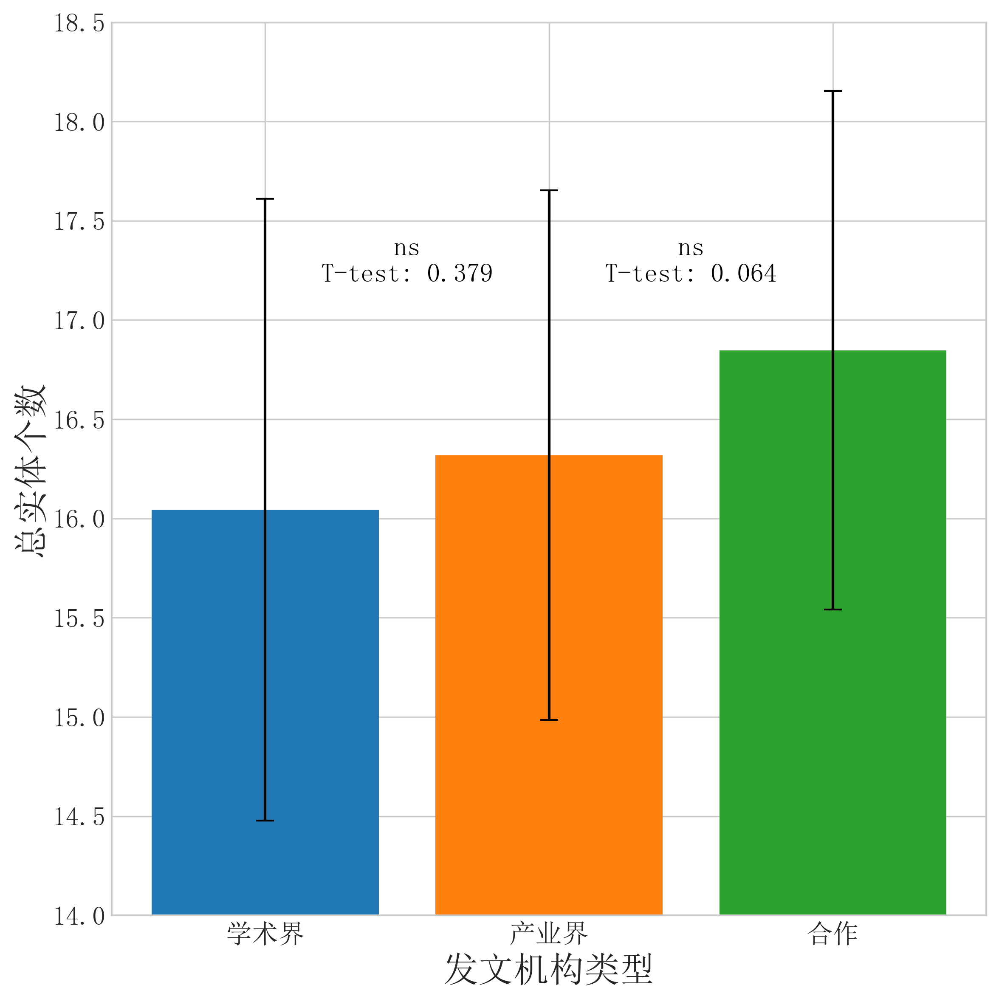

In [38]:
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm
from collections import defaultdict
import numpy as np
from scipy import stats

# 创建字典来存储每年不同类型机构的统计信息
yearly_institution_entity_stats = defaultdict(lambda: {
    'academic': {'total_papers': 0, 'total_entities': 0},
    'industry': {'total_papers': 0, 'total_entities': 0},
    'cooperation': {'total_papers': 0, 'total_entities': 0}
})

# 遍历每篇论文，按机构类型分类统计实体数量和论文数量
for record_id, record in tqdm(filter_ai_papers.items()):
    publication_year = record.get("publication_year", 0)

    if publication_year < 1980:
        continue

    category = record.get('category', 'other')
    if category not in ['academic', 'industry', 'cooperation']:
        continue

    entity_count = record.get('entity_count', 0)

    if entity_count > 0:
        if category == 'academic':
            yearly_institution_entity_stats[publication_year]['academic']['total_papers'] += 1
            yearly_institution_entity_stats[publication_year]['academic']['total_entities'] += entity_count
        elif category == 'industry':
            yearly_institution_entity_stats[publication_year]['industry']['total_papers'] += 1
            yearly_institution_entity_stats[publication_year]['industry']['total_entities'] += entity_count
        elif category == 'cooperation':
            yearly_institution_entity_stats[publication_year]['cooperation']['total_papers'] += 1
            yearly_institution_entity_stats[publication_year]['cooperation']['total_entities'] += entity_count

# 提取数据用于绘图和分析
academic_avg_entities = []
industry_avg_entities = []
cooperation_avg_entities = []

for year in sorted(yearly_institution_entity_stats.keys()):
    academic_data = yearly_institution_entity_stats[year]['academic']
    industry_data = yearly_institution_entity_stats[year]['industry']
    cooperation_data = yearly_institution_entity_stats[year]['cooperation']

    if academic_data['total_papers'] > 0:
        academic_avg = academic_data['total_entities'] / academic_data['total_papers']
        academic_avg_entities.append(academic_avg)
    if industry_data['total_papers'] > 0:
        industry_avg = industry_data['total_entities'] / industry_data['total_papers']
        industry_avg_entities.append(industry_avg)
    if cooperation_data['total_papers'] > 0:
        cooperation_avg = cooperation_data['total_entities'] / cooperation_data['total_papers']
        cooperation_avg_entities.append(cooperation_avg)

# 创建数据框用于绘图
data = {
    'institution_type': ['学术界', '产业界', '合作'], 
    'mean': [np.mean(academic_avg_entities), np.mean(industry_avg_entities), np.mean(cooperation_avg_entities)],
    'std': [np.std(academic_avg_entities), np.std(industry_avg_entities), np.std(cooperation_avg_entities)]
}
df = pd.DataFrame(data)

# 设置绘图风格
plt.figure(figsize=(8, 8), dpi=300)
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'SimSun'
plt.rcParams['font.size'] = 12

# 设置自定义颜色配色方案
palette = ['#1f77b4', '#ff7f0e','#2ca02c']

# 绘制柱状图并添加误差线
bars = plt.bar(df['institution_type'], df['mean'], yerr=df['std'], color=palette, capsize=5)

# 添加显著性星号
def get_significance(p_val):
    if p_val < 0.01:
        return '**'
    elif p_val < 0.05:
        return '*'
    else:
        return 'ns'

# 准备 t 检验的数据
academic = np.array(academic_avg_entities)
industry = np.array(industry_avg_entities)
cooperation = np.array(cooperation_avg_entities)

# 进行 t 检验
t_stat_1_2, p_val_1_2 = stats.ttest_ind(academic, industry, nan_policy='omit')
t_stat_2_3, p_val_2_3 = stats.ttest_ind(industry, cooperation, nan_policy='omit')

# 获取y轴的最大值，留白空间
y_max = max(df['mean'] + df['std']) + 0.02  # 增加一些顶部空间

# 添加显著性标注
plt.text(0.5, y_max-1, f'{get_significance(p_val_1_2)}\nT-test: {p_val_1_2:.3f}', ha='center', va='bottom', fontsize=15, color='black')
plt.text(1.5, y_max-1, f'{get_significance(p_val_2_3)}\nT-test: {p_val_2_3:.3f}', ha='center', va='bottom', fontsize=15, color='black')

# 添加标签和标题
plt.xlabel('发文机构类型', fontsize=20)
plt.ylabel('总实体个数', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

# 设置y轴范围
plt.ylim(14, 18.5)

# 添加图例
# plt.legend(['Average Entity Count'], loc='upper right', fontsize=12)

# 显示图形
plt.tight_layout()
plt.show()

#### Step 5 核心边缘分析

In [39]:
transition_to_core = {}  # 用于存储从边缘到核心的词
direct_core = {}  # 用于存储直接出现在核心的词

# 遍历每年的 coreness 数据
for year in tqdm(range(1981, max(yearly_cso_coreness.keys()))):
    # 获取当前年份和前一年中，核心概念的节点
    core_nodes_current = set([node for node, coreness in yearly_cso_coreness[year]['coreness'].items() if coreness > 0])
    core_nodes_previous = set([node for node, coreness in yearly_cso_coreness[year-1]['coreness'].items() if coreness > 0])
    
    # 分类从边缘走到核心的词和直接出现在核心的词
    transition_to_core[year] = set()  # 初始化当前年份的“从边缘到核心”词集合
    direct_core[year] = set()  # 初始化当前年份的“直接出现在核心”词集合
    
    for node in core_nodes_current:
        # 第一种情况：从边缘到核心的词，前一年是边缘，当前是核心
        # 如果当前年份的核心节点不在上一年核心节点中，说明它从边缘到核心
        if node not in core_nodes_previous:
            # 如果该节点在前一年是边缘节点（coreness == 0），那么说明它是从边缘到核心的
            if node in set([n for year_prev, coreness in yearly_cso_coreness.items() if year_prev < year and year_prev >= year-5 for n, c in coreness['coreness'].items() if c == 0]):
                transition_to_core[year].add(node)
        
        # 第二种情况：直接出现在核心的词，当前年份进入核心，但前面5年内没有出现过
        if node not in set([n for year_prev, coreness in yearly_cso_coreness.items() if year_prev < year and year_prev >= year-5 for n, c in coreness['coreness'].items()]):
            direct_core[year].add(node)  # 说明它是新进入核心的词

100%|██████████| 43/43 [02:24<00:00,  3.36s/it]


100%|██████████| 42/42 [00:00<?, ?it/s]


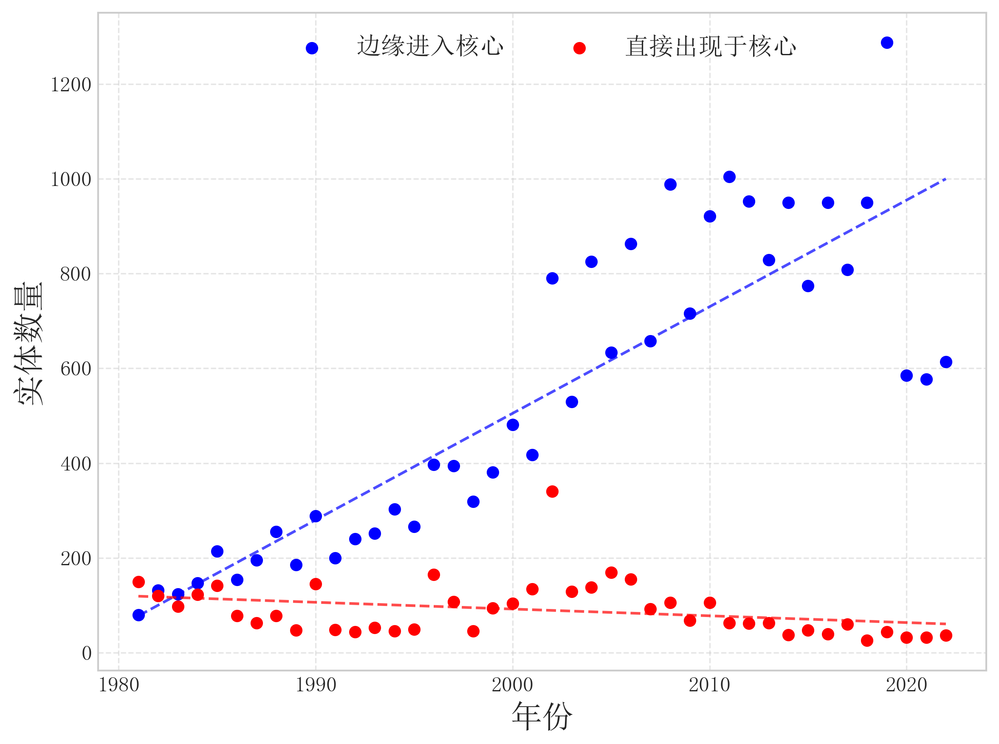

In [40]:
yearly_transition_counts = {}
yearly_direct_counts = {}

# 遍历每年的 coreness 数据
for year in tqdm(range(1981, max(yearly_cso_coreness.keys())-1)):
    yearly_transition_counts[year] = len(transition_to_core[year])
    yearly_direct_counts[year] = len(direct_core[year])

# 提取数据用于绘图
years = list(yearly_transition_counts.keys())
transition_counts = list(yearly_transition_counts.values())
direct_counts = list(yearly_direct_counts.values())

# 直线拟合
def add_fit_line(x, y, color, label):
    coefficients = np.polyfit(x, y, 1)
    poly = np.poly1d(coefficients)
    x_line = np.linspace(min(x), max(x), 100)
    y_line = poly(x_line)
    plt.plot(x_line, y_line, color=color, linestyle='--', alpha=0.7)

# 绘制散点图和拟合直线
plt.figure(figsize=(8, 6), dpi=300)
plt.scatter(years, transition_counts, color='b', marker='o', label='边缘进入核心')
add_fit_line(years, transition_counts, 'b', 'Transition Fit')

plt.scatter(years, direct_counts, color='r', marker='o', label='直接出现于核心')
add_fit_line(years, direct_counts, 'r', 'Direct Fit')

# plt.title('Yearly Counts of Transition and Direct Core Entities', fontsize=16)
plt.xlabel('年份', fontsize=18)
plt.ylabel('实体数量', fontsize=18)

# 图例居中，字体大小放大，横着展开
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1), ncol=2, fontsize=14)

plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [ ]:
for record_id, record in filter_ai_papers.items():
    publication_year = record['publication_year']
    if publication_year <= 1980 or publication_year >= 2022:
        continue
    
    # 获取匹配的颠覆性值
    disruptiveness = cd5_dict.get(record_id[1:])  # 获取颠覆性值（字符串形式）

    # 获取匹配的新颖性
    novelty_ = novelty_dict.get(record_id[1:])

    
    # 检查是否匹配成功且颠覆性值有效
    if disruptiveness is not None:
        try:
            disruptiveness = float(disruptiveness)  # 将字符串转换为浮点数
            record['disruptiveness'] = disruptiveness
        except ValueError:
            # 如果转换失败（例如，数据格式错误），跳过该记录
            continue

    if novelty_ is not None:
        try:
            novelty = float(novelty_.get('Atyp_10pct_Z'))  # 将字符串转换为浮点数
            record['novelty'] = novelty
        except ValueError:
            # 如果转换失败（例如，数据格式错误），跳过该记录
            continue

#### Step 6 计算年龄

In [42]:
# 初始化存储每个实体首次出现在核心中的年份
entity_first_core_year = {}

# 遍历每年的核心节点
for year in tqdm(sorted(yearly_cso_coreness.keys())):
    core_nodes = set()
    for node, coreness in yearly_cso_coreness[year]['coreness'].items():
        if coreness > 0:
            core_nodes.add(node)
    
    # 更新实体首次出现在核心中的年份
    for node in core_nodes:
        if node not in entity_first_core_year:
            entity_first_core_year[node] = year

# 计算每个实体的年龄（当前年份减去首次出现在核心中的年份）
entity_age = {}
current_year = max(yearly_cso_coreness.keys())

for node, first_year in entity_first_core_year.items():
    entity_age[node] = current_year - first_year

100%|██████████| 45/45 [00:00<00:00, 1583.58it/s]


100%|██████████| 45/45 [00:00<00:00, 1612.50it/s]


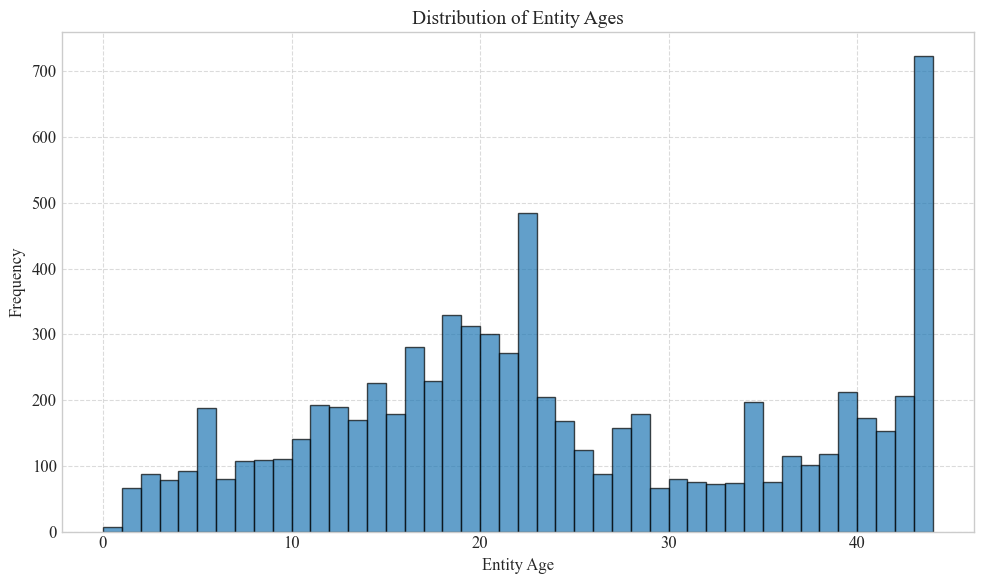

In [97]:
import matplotlib.pyplot as plt

# 初始化存储每个实体首次出现在核心中的年份
entity_first_core_year = {}

# 遍历每年的核心节点
for year in tqdm(sorted(yearly_cso_coreness.keys())):
    core_nodes = set()
    for node, coreness in yearly_cso_coreness[year]['coreness'].items():
        if coreness > 0:
            core_nodes.add(node)
    
    # 更新实体首次出现在核心中的年份
    for node in core_nodes:
        if node not in entity_first_core_year:
            entity_first_core_year[node] = year

# 计算每个实体的年龄（当前年份减去首次出现在核心中的年份）
entity_age = {}
current_year = max(yearly_cso_coreness.keys())

for node, first_year in entity_first_core_year.items():
    entity_age[node] = current_year - first_year

# 提取年龄数据用于绘图
ages = list(entity_age.values())

# 绘制实体年龄的分布直方图
plt.figure(figsize=(10, 6))
plt.hist(ages, bins=range(min(ages), max(ages) + 1), edgecolor='black', alpha=0.7)

plt.title('Distribution of Entity Ages', fontsize=14)
plt.xlabel('Entity Age', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

100%|██████████| 45/45 [00:00<00:00, 1612.52it/s]


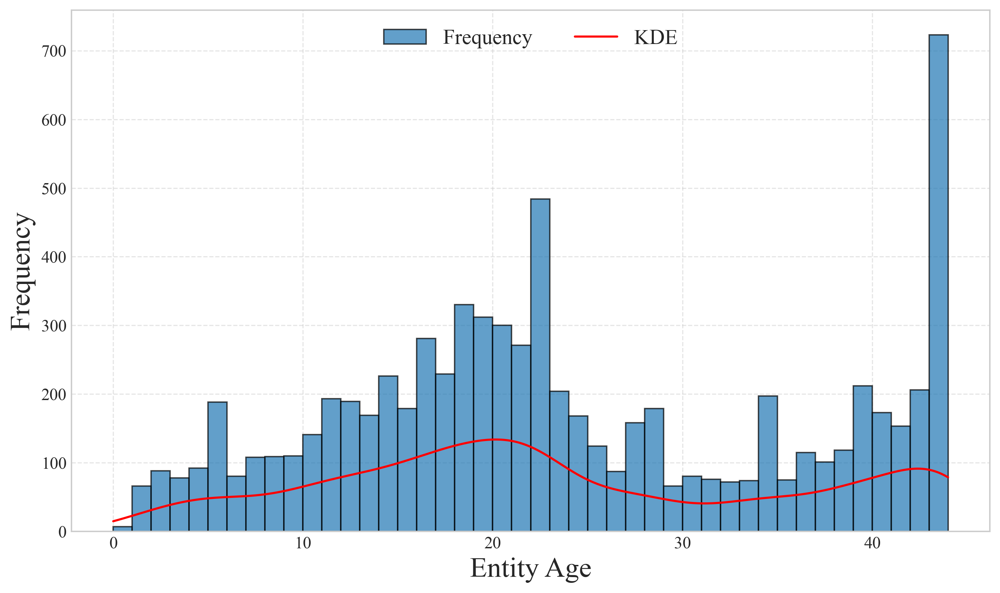

In [186]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
import tqdm

# 初始化存储每个实体首次出现在核心中的年份
entity_first_core_year = {}

# 遍历每年的核心节点
for year in tqdm.tqdm(sorted(yearly_cso_coreness.keys())):
    core_nodes = set()
    for node, coreness in yearly_cso_coreness[year]['coreness'].items():
        if coreness > 0:
            core_nodes.add(node)
    
    # 更新实体首次出现在核心中的年份
    for node in core_nodes:
        if node not in entity_first_core_year:
            entity_first_core_year[node] = year

# 计算每个实体的年龄（当前年份减去首次出现在核心中的年份）
entity_age = {}
current_year = max(yearly_cso_coreness.keys())

for node, first_year in entity_first_core_year.items():
    entity_age[node] = current_year - first_year

# 提取年龄数据用于绘图
ages = list(entity_age.values())

# 计算核密度估计
kde = gaussian_kde(ages)
x_values = np.linspace(min(ages), max(ages), 1000)

# 绘制实体年龄的分布直方图
plt.figure(figsize=(10, 6), dpi=300)
plt.hist(ages, bins=range(min(ages), max(ages) + 1), edgecolor='black', alpha=0.7, color='#1f77b4', label='Frequency')

# 绘制核密度估计曲线
plt.plot(x_values, kde(x_values) * len(ages) * (max(ages) - min(ages)) / 100, color='red', label='KDE')

# 添加标签和标题
# plt.title('Distribution of Entity Ages', fontsize=16)
plt.xlabel('Entity Age', fontsize=20)
plt.ylabel('Frequency', fontsize=20)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1), ncol=2, fontsize=15)
plt.grid(True, linestyle='--', alpha=0.5)

# 调整布局并显示图表
plt.tight_layout()
plt.show()

In [ ]:
filter_ai_papers

##### 分析子领域

In [43]:
import matplotlib.pyplot as plt
from collections import defaultdict

# 初始化字典来存储每年按机构类型和子领域的平均论文年龄
yearly_avg_age_by_subconcept = defaultdict(lambda: defaultdict(lambda: {'academic': [], 'industry': [], 'cooperation': []}))
yearly_avg_age = defaultdict(lambda: {'academic': [], 'industry': [], 'cooperation': []})

# 遍历每篇论文并提取所需信息
for record_id, record in tqdm(filter_ai_papers.items()):
    publication_year = record.get("publication_year", 0)
    if publication_year < 1980:
        continue

    authorships = record.get('authorships', [])
    institution_type = classify_institution_type(authorships)
    if institution_type == 'other':
        continue

    # 获取具体子类别信息
    sub_concepts = record.get('sub concepts', [])
    sub_concept = sub_concepts[0] if sub_concepts else 'unknown'

    # 获取该论文的实体列表
    entity_lists = []
    if record_id in cso_result and 'explanation' in cso_result[record_id]:
        entity_lists = list(cso_result[record_id]['explanation'].keys())

    # 计算论文中每个核心实体的年龄
    core_entity_ages = []
    for entity in entity_lists:
        if entity in entity_first_core_year:
            core_entity_ages.append(max(publication_year - entity_first_core_year[entity], 0))
            
    if core_entity_ages:
        # 计算要取的最年轻的实体数量（至少1个）
        num_youngest = max(1, int(len(core_entity_ages) * 0.3))
        youngest_ages = sorted(core_entity_ages)[:num_youngest]
        avg_youngest_ages = sum(youngest_ages) / len(youngest_ages)
    else:
        avg_youngest_ages = 0  # 如果没有核心实体，则平均年龄设为0
    
    record['mature'] = avg_youngest_ages

    # 将结果存储到字典中
    if publication_year >= 2000 and publication_year <=2023:
        yearly_avg_age_by_subconcept[sub_concept][publication_year][institution_type].append(avg_youngest_ages)
        yearly_avg_age[publication_year][institution_type].append(avg_youngest_ages)

100%|██████████| 1377520/1377520 [00:11<00:00, 122709.98it/s]


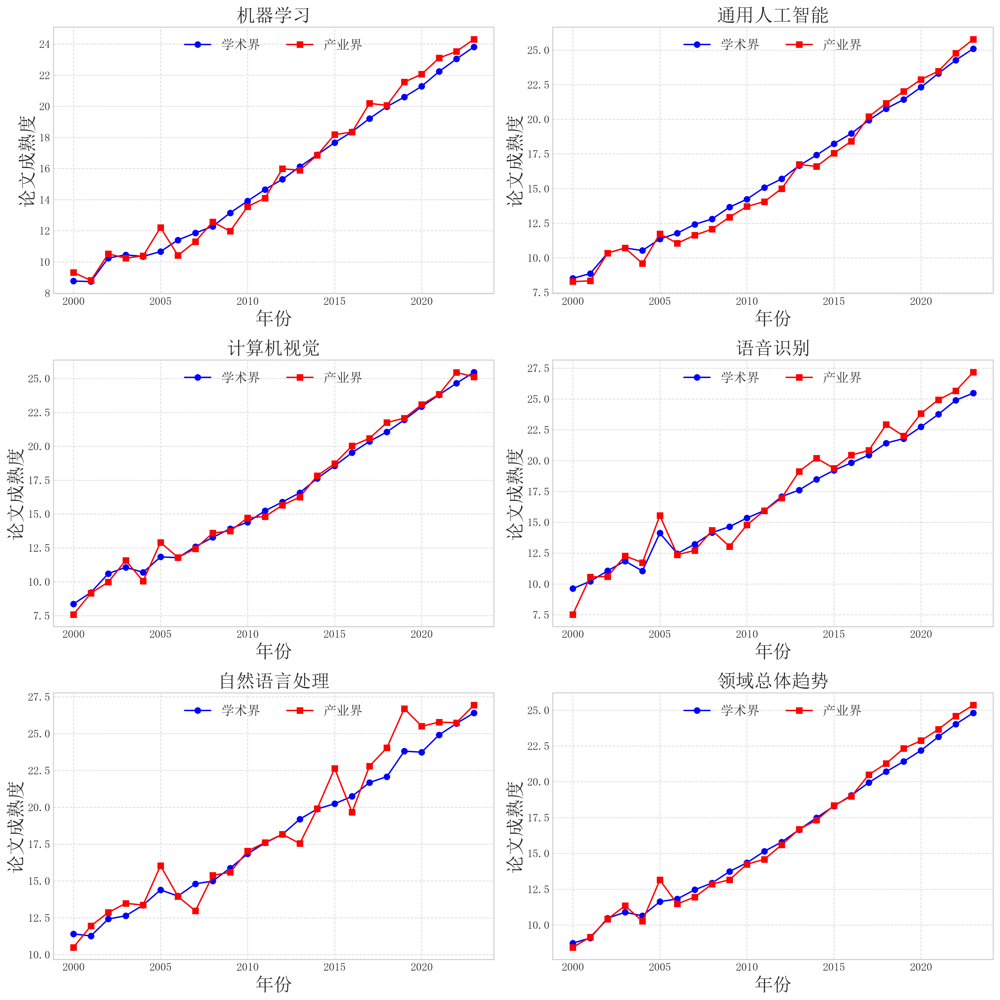

In [46]:
# 获取所有唯一的子类别
sub_concepts = list(yearly_avg_age_by_subconcept.keys())[:5]  # 只取前5个子类别

# 绘制子图
num_subplots = 6  # 总共绘制6个图
num_cols = 2
num_rows = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15),dpi=300)
axes = axes.flatten()

# 定义子概念到中文标签的映射
subconcept_labels = {
    'Artificial Intelligence': '通用人工智能',
    'Computer Vision': '计算机视觉',
    'Machine Learning': '机器学习',
    'Natural Language Processing': '自然语言处理',
    'Speech Recognition': '语音识别'
}

# 绘制每个子类别的图
for i, sub_concept in enumerate(sub_concepts):
    ax = axes[i]
    years = sorted(yearly_avg_age_by_subconcept[sub_concept].keys())
    
    # 准备数据
    academic_avg = []
    industry_avg = []
    
    for year in years:
        academic_data = yearly_avg_age_by_subconcept[sub_concept][year]['academic']
        industry_data = yearly_avg_age_by_subconcept[sub_concept][year]['industry']
        
        if academic_data:
            academic_avg.append(sum(academic_data)/len(academic_data))
        else:
            academic_avg.append(None)
            
        if industry_data:
            industry_avg.append(sum(industry_data)/len(industry_data))
        else:
            industry_avg.append(None)
    
    # 绘制折线图
    valid_academic = [x for x in academic_avg if x is not None]
    valid_industry = [x for x in industry_avg if x is not None]
    
    ax.plot(years[:len(valid_academic)], valid_academic, label='学术界', color='blue', marker='o')
    ax.plot(years[:len(valid_industry)], valid_industry, label='产业界', color='red', marker='s')
    
    ax.set_xlabel('年份', fontsize=20)
    ax.set_ylabel('论文成熟度', fontsize=20)
    ax.set_title(f'{subconcept_labels.get(sub_concept)}', fontsize=20)
    ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1), ncol=2, fontsize=14)
    ax.grid(True, linestyle='--', alpha=0.7)

# 绘制总体趋势图
ax = axes[5]
years = sorted(yearly_avg_age.keys())
academic_avg = []
industry_avg = []

for year in years:
    academic_data = yearly_avg_age[year]['academic']
    industry_data = yearly_avg_age[year]['industry']
    
    if academic_data:
        academic_avg.append(sum(academic_data)/len(academic_data))
    else:
        academic_avg.append(None)
        
    if industry_data:
        industry_avg.append(sum(industry_data)/len(industry_data))
    else:
        industry_avg.append(None)

valid_academic = [x for x in academic_avg if x is not None]
valid_industry = [x for x in industry_avg if x is not None]

ax.plot(years[:len(valid_academic)], valid_academic, label='学术界', color='blue', marker='o')
ax.plot(years[:len(valid_industry)], valid_industry, label='产业界', color='red', marker='s')

ax.set_xlabel('年份', fontsize=20)
ax.set_ylabel('论文成熟度', fontsize=20)
ax.set_title('领域总体趋势', fontsize=20)
ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1), ncol=2, fontsize=14)
ax.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

#### Step 7 加载颠覆性和新颖性

In [55]:
tsv_file = r'E:\tinierZhao\sciERC\SciSciNet-CD5\SciSciNet_Paper_CD5.tsv'
cd5_dict = {}

with open(tsv_file, mode='r', newline='', encoding='utf-8') as file:
    reader = csv.reader(file, delimiter='\t')  # 指定制表符作为分隔符
    for row in reader:
        if len(row) == 2:  # 确保每行有两个元素
            key, value = row
            cd5_dict[key] = value

In [99]:
# 保存新颖性字典
with open('./data/novelty_dict.pkl', 'rb') as f:
    novelty_dict = pickle.load(f)

In [56]:
import csv
tsv_novelty_file = r'E:\tinierZhao\sciERC\SciSciNet_Papers\SciSciNet_Papers.tsv'

# 初始化一个空字典来存储结果
novelty_dict = {}

# 打开TSV文件并读取内容
with open(tsv_novelty_file, 'r', encoding='utf-8') as file:
    reader = csv.DictReader(file, delimiter='\t')  # 使用csv模块读取TSV文件
    for row in tqdm(reader):
        paper_id = row['PaperID']
        atyp_10pct_z = row['Atyp_10pct_Z']
        atyp_median_z = row['Atyp_Median_Z']
        
        # 检查是否有空值
        if atyp_10pct_z and atyp_median_z:  # 确保两个字段都不为空
            novelty_dict[paper_id] = {
                'Atyp_10pct_Z': float(atyp_10pct_z),  # 转换为浮点数
                'Atyp_Median_Z': float(atyp_median_z)  # 转换为浮点数
            }

134129188it [07:35, 294301.88it/s]


In [57]:
tsv_file = r'E:\tinierZhao\sciERC\SciSciNet_Papers\SciSciNet_Papers.tsv'

# 初始化一个空字典来存储结果
c5_dict = {}

# 打开TSV文件并读取内容
with open(tsv_file, 'r', encoding='utf-8') as file:
    reader = csv.DictReader(file, delimiter='\t')  # 使用csv模块读取TSV文件
    for row in tqdm(reader):
        paper_id = row['PaperID']
        c5 = row['C5']  # 获取五年引用计数字段
        
        if c5:  # 确保C5字段不为空
            try:
                # 先将字符串转换为浮点数，再从浮点数转换为整数
                c5_dict[paper_id] = int(float(c5))
            except ValueError as e:
                print(f"Error converting C5 value '{c5}' for PaperID {paper_id}: {e}")

# 打印结果字典的前几项，确认是否正确
for key, value in list(c5_dict.items())[:5]:
    print(f"PaperID: {key}, C5: {value}")

134129188it [07:18, 306024.25it/s]

PaperID: 2789336, C5: 1
PaperID: 9552966, C5: 0
PaperID: 9694411, C5: 0
PaperID: 14355006, C5: 0
PaperID: 14558443, C5: 9


In [63]:
for record_id, record in filter_ai_papers.items():
    publication_year = record['publication_year']
    if publication_year <= 1980 or publication_year >= 2022:
        continue
    
    # 获取匹配的颠覆性值
    disruptiveness = cd5_dict.get(record_id[1:])  # 获取颠覆性值（字符串形式）

    # 获取匹配的新颖性
    novelty_ = novelty_dict.get(record_id[1:])

    
    # 检查是否匹配成功且颠覆性值有效
    if disruptiveness is not None:
        try:
            disruptiveness = float(disruptiveness)  # 将字符串转换为浮点数
            record['disruptiveness'] = disruptiveness
        except ValueError:
            # 如果转换失败（例如，数据格式错误），跳过该记录
            continue

    if novelty_ is not None:
        try:
            novelty = float(novelty_.get('Atyp_10pct_Z'))  # 将字符串转换为浮点数
            record['novelty'] = novelty
        except ValueError:
            # 如果转换失败（例如，数据格式错误），跳过该记录
            continue

In [7]:
# 保存新颖性字典
with open('./data/novelty_dict.pkl', 'wb') as f:
    pickle.dump(novelty_dict, f)

##### 保存到csv

In [106]:
import pandas as pd
from tqdm import tqdm

# 创建一个 DataFrame 来存储每篇论文的信息
columns = [
    'record_id', 'publication_year', 
    'author_count', 'country_count', 'institution_count',
    'sub_concept', 'institution_type',
    'peripheral_entity', 'entity_count',
    'disruptiveness', 'novelty',
    'avg_youngest_ages'
]
data = []

# 遍历每篇论文并提取所需信息
for record_id, record in tqdm(filter_ai_papers.items()):
    publication_year = record.get("publication_year", 0)
    if publication_year < 1980:
        continue

    disruptiveness = record.get('disruptiveness', None)
    novelty = record.get('novelty', None)

    authorships = record.get('authorships', [])
    institution_type = classify_institution_type(authorships)
    if institution_type == 'other':
        continue

    # 获取作者数量
    author_count = len(authorships)

    # 获取具体子类别信息
    sub_concepts = record.get('sub concepts', [])
    sub_concept = sub_concepts[0] if sub_concepts else None

    core_entity_count = record.get('core_entity_count', 0)
    entity_count = record.get('entity_count', 0)

    peripheral_entity = core_entity_count / entity_count if entity_count > 0 else 0

    # 获取该论文的实体列表
    if record_id in cso_result and 'explanation' in cso_result[record_id]:
        entity_lists = list(cso_result[record_id]['explanation'].keys())
        

    avg_youngest_ages = record['mature']

    # 添加到数据列表
    data.append([
        record_id, 
        publication_year, 
        author_count, 
        record.get('country_count', 0), 
        record.get('institution_count', 0),
        sub_concept,
        institution_type,
        peripheral_entity,
        entity_count,
        disruptiveness,
        novelty,
        avg_youngest_ages
    ])

# 创建 DataFrame
df = pd.DataFrame(data, columns=columns)

# 导出为 CSV 文件
output_file = './data/age_novelty_disruptive_0521.csv'
df.to_csv(output_file, index=False)

print(f"Filtered data has been saved to {output_file}")

100%|██████████| 1377520/1377520 [00:03<00:00, 348813.20it/s]


Filtered data has been saved to ./data/age_novelty_disruptive_0521.csv


In [ ]:
# stata 代码
# outreg2 using "结果.doc", replace drop(i.publication_year* ) bdec(3) sdec(3)

# encode sub_concept, generate(subcon)

# gen academic = ( institution_type == "academic")

#### Step 3 计算核心节点占比

In [107]:
core_ratio_per_year = {}

# 遍历每年的 coreness 数据
for year, coreness_dict in tqdm(yearly_cso_coreness.items()):

    core_nodes = [node for node, coreness in coreness_dict['coreness'].items() if coreness > 0]
    total_nodes = len(coreness_dict['coreness'])
    core_ratio = len(core_nodes) / total_nodes if total_nodes > 0 else 0
    core_ratio_per_year[year] = core_ratio

100%|██████████| 45/45 [00:00<00:00, 3473.19it/s]


In [108]:
core_ratio_per_year

{1998: 0.6185912793483469,
 2005: 0.5566343042071198,
 2014: 0.5707141740897015,
 2022: 0.5692624760783159,
 2003: 0.5503656522764803,
 2020: 0.6678445229681979,
 2017: 0.5336756266988825,
 2023: 0.702928870292887,
 2021: 0.6788523157588116,
 2016: 0.5445147353803426,
 2011: 0.5550631872640736,
 2009: 0.5527510441256582,
 2012: 0.5758338577721838,
 1996: 0.6151461470327724,
 2010: 0.5355394225899037,
 1999: 0.595014303228443,
 2008: 0.5752793048412839,
 2013: 0.5518348623853211,
 2018: 0.5461733552140833,
 2002: 0.6109436587062369,
 2007: 0.5380863039399625,
 1990: 0.6598599766627772,
 2004: 0.5856378233719893,
 1980: 0.660857908847185,
 1993: 0.6375574523965857,
 1986: 0.6459074733096085,
 1995: 0.6042460533478498,
 2006: 0.5691116844821231,
 1985: 0.6749226006191951,
 2000: 0.6287822878228783,
 1989: 0.6556047197640118,
 1997: 0.6200701139351447,
 2015: 0.5252211702623002,
 2001: 0.5980456026058631,
 1991: 0.6624022743425728,
 1987: 0.6513274336283186,
 2024: 0.6831809872029251,
 198

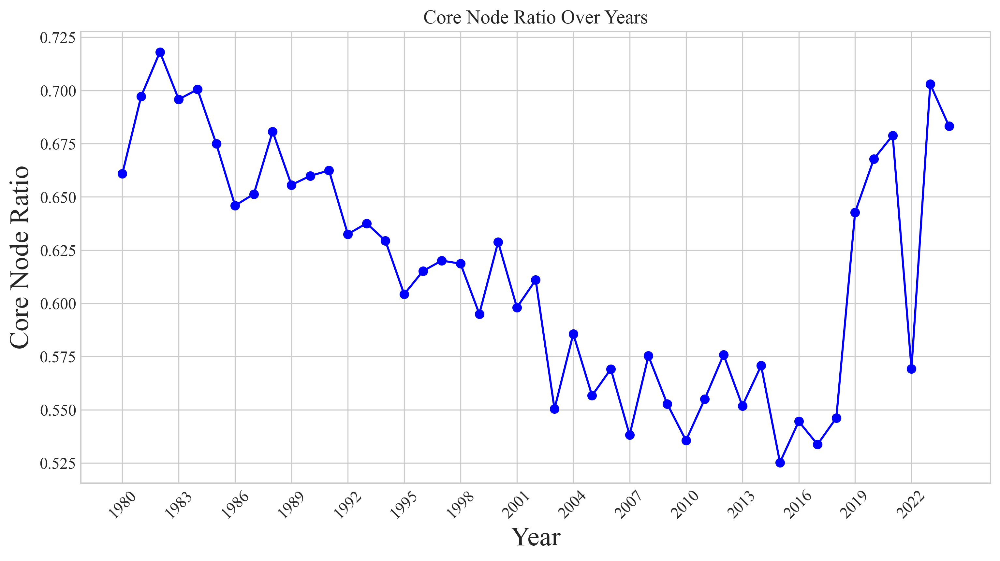

In [109]:
# 按年份排序
sorted_years = sorted(core_ratio_per_year.keys())
sorted_ratios = [core_ratio_per_year[year] for year in sorted_years]

# 绘制折线图
plt.figure(figsize=(12, 6),dpi=300)
plt.plot(sorted_years, sorted_ratios, marker='o', linestyle='-', color='blue')
plt.xlabel('Year',fontsize=20)
plt.ylabel('Core Node Ratio',fontsize=20)
plt.title('Core Node Ratio Over Years')
plt.xticks(sorted_years[::3], rotation=45)  # 每隔三年显示一次，并将标签旋转45度
plt.show()

#### Step 4 计算核心节点数量

In [11]:
pair_num_per_year = {}

# 遍历每年的 coreness 数据
for year, coreness_dict in tqdm(yearly_coreness_results.items()):

    # 找出最大的 pair_id
    max_pair_id = max(coreness_dict['pair_id'].values()) + 1
    pair_num_per_year[year] = max_pair_id

100%|██████████| 45/45 [00:00<00:00, 5624.90it/s]


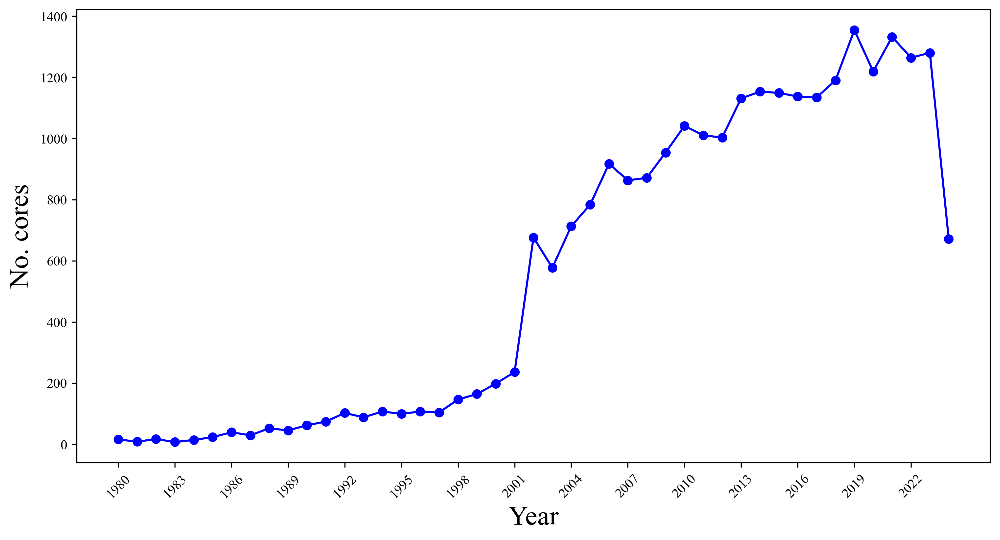

In [12]:
# 按年份排序
sorted_years = sorted(pair_num_per_year.keys())
sorted_num = [pair_num_per_year[year] for year in sorted_years]

# 绘制折线图
plt.figure(figsize=(12, 6),dpi=300)
plt.plot(sorted_years, sorted_num, marker='o', linestyle='-', color='blue')
plt.xlabel('Year',fontsize=20)
plt.ylabel('No. cores',fontsize=20)
plt.xticks(sorted_years[::3], rotation=45)  # 每隔三年显示一次，并将标签旋转45度
plt.show()

####  Step 5 计算核心节点流失

In [11]:
cit_values = {}

# 遍历每年的 coreness 数据
for year in range(1981, max(yearly_coreness_results.keys())):

    core_nodes_current = set([node for node, coreness in yearly_coreness_results[year]['coreness'].items() if coreness > 0])
    core_nodes_previous = set([node for node, coreness in yearly_coreness_results[year-1]['coreness'].items() if coreness > 0])
    
    common_count = len(core_nodes_current.intersection(core_nodes_previous))
    # 当前年份的核心概念数
    current_count = len(core_nodes_current)

    cit = 1 - (common_count/current_count)
    
    cit_values[year] = cit

#### 过滤论文

In [5]:
def count_countries_and_institutions(authorships):
    countries = set()
    institutions = set()

    for authorship in authorships:
        institution_country = authorship.get('institution_country', 'unknown')
        institution_name = authorship.get('institution_name', 'unknown')

        # 添加到集合中
        countries.add(institution_country)
        institutions.add(institution_name)

    # 计算国家数量和机构数量
    country_count = len(countries)
    institution_count = len(institutions)

    # 返回结果
    return {
        'country_count': country_count,
        'institution_count': institution_count
    }

In [6]:
# 遍历每篇论文
for record_id, record in tqdm(ai_papers.items()):
    authorships = record.get('authorships', [])
    category = classify_institution_type(authorships)

    # 统计国家数量和机构数量
    counts = count_countries_and_institutions(authorships)

    # 将分类结果和统计结果存储回 ai_papers 数据结构中
    record['category'] = category
    record['country_count'] = counts['country_count']
    record['institution_count'] = counts['institution_count']

100%|██████████| 1845637/1845637 [00:03<00:00, 522682.02it/s]


In [7]:
filtered_ai_papers = {}

# 遍历每篇论文
for record_id, record in ai_papers.items():
    publication_year = record['publication_year']
    if publication_year < 1980:
        continue
    # 获取实体和作者信息
    entities = record.get('entity', [])
    authorships = record.get('authorships', [])

    # 对论文进行分类
    category = classify_institution_type(authorships)

    # 如果分类为 'other'，则跳过
    if category == 'other':
        continue

    # 过滤条件：entity 和 authorships 都不能为空
    if entities and authorships:
        filtered_ai_papers[record_id] = record

# 打印过滤后的论文数量
print(f"Original papers: {len(ai_papers)}")
print(f"Filtered papers: {len(filtered_ai_papers)}")

Original papers: 1845637
Filtered papers: 1377520


In [8]:
ai_cate_dict = {"Artificial Intelligence": [
        "artificial intelligence", "machine learning", "natural language processing", 
        "speech recognition", "computer vision"
    ]}
ai_cate_dict

{'Artificial Intelligence': ['artificial intelligence',
  'machine learning',
  'natural language processing',
  'speech recognition',
  'computer vision']}

In [9]:
filtered_ai_papers['W2079817815']['concepts']

['Computer science',
 'Algorithm',
 'Mathematics',
 'Artificial intelligence',
 'Mathematical analysis',
 'Statistics',
 'Computer hardware',
 'Computer vision']

In [10]:
# 定义AI子领域及其关键词
ai_cate_dict = {
    "Machine Learning": ["machine learning"],
    "Natural Language Processing": ["natural language processing"],
    "Speech Recognition": ["speech recognition"],
    "Computer Vision": ["computer vision"],
}

# 初始化一个字典来统计每个子领域的论文数量
sub_category_paper_count = {sub_category: 0 for sub_category in ai_cate_dict.keys()}
sub_category_paper_count["Artificial Intelligence"] = 0  # 添加默认分类

# 遍历filtered_ai_papers字典
for paper_id, paper_info in filtered_ai_papers.items():
    concepts = paper_info.get('concepts', [])  # 获取论文的concepts字段
    matched_sub_categories = []  # 用于存储匹配到的子领域

    # 遍历AI子领域字典
    for sub_category, keywords in ai_cate_dict.items():
        for concept in concepts:
            if concept.lower() in [keyword.lower() for keyword in keywords]:  # 不区分大小写匹配
                matched_sub_categories.append(sub_category)

    # 如果没有匹配到任何具体子领域，则归类为“Artificial Intelligence”
    if not matched_sub_categories:
        matched_sub_categories.append("Artificial Intelligence")

    # 更新统计
    for sub_category in matched_sub_categories:
        sub_category_paper_count[sub_category] += 1

    # 将分类结果存储到原始数据中，添加新字段"子类别"
    paper_info["sub concepts"] = matched_sub_categories

In [11]:
filtered_ai_papers['W2079817815']["sub concepts"]

['Computer Vision']

##### 保存过滤后 + 添加字段后的ai论文 

In [83]:
with open('./data/filter_ai_papers_0312.pkl', 'wb') as f:
    pickle.dump(filtered_ai_papers,f)

In [82]:
# 打印每个子领域的论文数量统计
print("\nSub-Category Paper Count:")
for sub_category, count in sub_category_paper_count.items():
    print(f"{sub_category}: {count} papers")


Sub-Category Paper Count:
Machine Learning: 230722 papers
Natural Language Processing: 48718 papers
Speech Recognition: 58567 papers
Computer Vision: 245614 papers
Artificial Intelligence: 526185 papers


#### 颠覆性

In [22]:
novelty_dict

{'2789336': {'Atyp_10pct_Z': 5.499999999999999,
  'Atyp_Median_Z': 17.556042444793682},
 '9552966': {'Atyp_10pct_Z': -6.808985996374422,
  'Atyp_Median_Z': 3.4643817125483123},
 '35428871': {'Atyp_10pct_Z': -18.43368547742707,
  'Atyp_Median_Z': -0.401707124466329},
 '55534668': {'Atyp_10pct_Z': -6.489632222563413,
  'Atyp_Median_Z': 15.54169199572006},
 '62531800': {'Atyp_10pct_Z': 90.19630284977342,
  'Atyp_Median_Z': 502.2886799767509},
 '84606111': {'Atyp_10pct_Z': 2.043775842245837,
  'Atyp_Median_Z': 146.02931938133034},
 '85876004': {'Atyp_10pct_Z': 179.40647724823637,
  'Atyp_Median_Z': 475.6206215352996},
 '128790541': {'Atyp_10pct_Z': 3.607906399909528,
  'Atyp_Median_Z': 13.666666666666668},
 '143136583': {'Atyp_10pct_Z': -5.243387264369481,
  'Atyp_Median_Z': 36.95512030127008},
 '178529119': {'Atyp_10pct_Z': 148.44321308560708,
  'Atyp_Median_Z': 222.9922102704493},
 '191292197': {'Atyp_10pct_Z': 23.854083672896586,
  'Atyp_Median_Z': 31.854166666666664},
 '204935239': {'A

In [28]:
yearly_matches = defaultdict(int)

# 遍历每篇论文
for record_id, record in filtered_ai_papers.items():
    publication_year = record['publication_year']
    if publication_year <= 1980 or publication_year >=2024:
        continue
    
    # 检查是否匹配成功
    if record_id[1:] in cd5_dict:
        yearly_matches[publication_year] += 1

years = sorted(yearly_matches.keys())
match_counts = [yearly_matches[year] for year in years]

In [60]:
cnt = 0

# 遍历每篇论文
for record_id, record in filtered_ai_papers.items():
    publication_year = record['publication_year']
    if publication_year <= 1980 or publication_year >=2024:
        continue
    
    # 检查是否匹配成功
    if record_id[1:] in c5_dict:
        cnt += 1

print(cnt)

565137


In [59]:
novelty_dict

{'2789336': {'Atyp_10pct_Z': 5.499999999999999,
  'Atyp_Median_Z': 17.556042444793682},
 '9552966': {'Atyp_10pct_Z': -6.808985996374422,
  'Atyp_Median_Z': 3.4643817125483123},
 '35428871': {'Atyp_10pct_Z': -18.43368547742707,
  'Atyp_Median_Z': -0.401707124466329},
 '55534668': {'Atyp_10pct_Z': -6.489632222563413,
  'Atyp_Median_Z': 15.54169199572006},
 '62531800': {'Atyp_10pct_Z': 90.19630284977342,
  'Atyp_Median_Z': 502.2886799767509},
 '84606111': {'Atyp_10pct_Z': 2.043775842245837,
  'Atyp_Median_Z': 146.02931938133034},
 '85876004': {'Atyp_10pct_Z': 179.40647724823637,
  'Atyp_Median_Z': 475.6206215352996},
 '128790541': {'Atyp_10pct_Z': 3.607906399909528,
  'Atyp_Median_Z': 13.666666666666668},
 '143136583': {'Atyp_10pct_Z': -5.243387264369481,
  'Atyp_Median_Z': 36.95512030127008},
 '178529119': {'Atyp_10pct_Z': 148.44321308560708,
  'Atyp_Median_Z': 222.9922102704493},
 '191292197': {'Atyp_10pct_Z': 23.854083672896586,
  'Atyp_Median_Z': 31.854166666666664},
 '204935239': {'A

In [103]:
from collections import defaultdict
import numpy as np

# 初始化每年平均颠覆性的字典
yearly_disruptiveness = defaultdict(list)
yearly_novelty = defaultdict(list)

# 遍历每篇论文
for record_id, record in filter_ai_papers.items():
    publication_year = record['publication_year']
    if publication_year <= 1980 or publication_year >= 2024:
        continue
    
    # 获取匹配的颠覆性值
    disruptiveness = cd5_dict.get(record_id[1:])  # 获取颠覆性值（字符串形式）

    # 获取匹配的新颖性
    novelty_ = novelty_dict.get(record_id[1:])

    # 检查是否匹配成功且颠覆性值有效
    if disruptiveness is not None:
        try:
            disruptiveness = float(disruptiveness)  # 将字符串转换为浮点数
            yearly_disruptiveness[publication_year].append(disruptiveness)
            record['disruptiveness'] = disruptiveness
        except ValueError:
            # 如果转换失败（例如，数据格式错误），跳过该记录
            continue

    if novelty_ is not None:
        try:
            novelty = float(novelty_.get('Atyp_10pct_Z'))  # 将字符串转换为浮点数
            yearly_novelty[publication_year].append(novelty)
            record['novelty'] = novelty
        except ValueError:
            # 如果转换失败（例如，数据格式错误），跳过该记录
            continue

# 计算每年的平均颠覆性
average_disruptiveness = {}
for year, values in yearly_disruptiveness.items():
    if values:  # 确保列表不为空
        average_disruptiveness[year] = np.mean(values)
    else:
        average_disruptiveness[year] = None  # 如果为空，记录为 None

##### 分析两种进入核心节点的模式 从边缘演化，或是直接出现并进入核心

In [12]:
transition_to_core = {}  # 用于存储从边缘到核心的词
direct_core = {}  # 用于存储直接出现在核心的词

# 遍历每年的 coreness 数据
for year in tqdm(range(1981, max(yearly_coreness_results.keys()))):
    # 获取当前年份和前一年中，核心概念的节点
    core_nodes_current = set([node for node, coreness in yearly_coreness_results[year]['coreness'].items() if coreness > 0])
    core_nodes_previous = set([node for node, coreness in yearly_coreness_results[year-1]['coreness'].items() if coreness > 0])
    
    # 分类从边缘走到核心的词和直接出现在核心的词
    transition_to_core[year] = set()  # 初始化当前年份的“从边缘到核心”词集合
    direct_core[year] = set()  # 初始化当前年份的“直接出现在核心”词集合
    
    for node in core_nodes_current:
        # 第一种情况：从边缘到核心的词，前一年是边缘，当前是核心
        # 如果当前年份的核心节点不在上一年核心节点中，说明它从边缘到核心
        if node not in core_nodes_previous:
            # 如果该节点在前一年是边缘节点（coreness == 0），那么说明它是从边缘到核心的
            if node in set([n for year_prev, coreness in yearly_coreness_results.items() if year_prev < year and year_prev >= year-5 for n, c in coreness['coreness'].items() if c == 0]):
                transition_to_core[year].add(node)
        
        # 第二种情况：直接出现在核心的词，当前年份进入核心，但前面5年内没有出现过
        if node not in set([n for year_prev, coreness in yearly_coreness_results.items() if year_prev < year and year_prev >= year-5 for n, c in coreness['coreness'].items()]):
            direct_core[year].add(node)  # 说明它是新进入核心的词

100%|██████████| 43/43 [14:54<00:00, 20.79s/it] 


#### 流出节点

In [52]:
# 初始化统计字典
flow_out_core = {}

# 遍历每年的 coreness 数据
for year in tqdm(range(1981, max(yearly_coreness_results.keys()) + 1)):
    # 获取当前年份和前一年中，核心概念的节点
    core_nodes_current = set([node for node, coreness in yearly_coreness_results[year]['coreness'].items() if coreness > 0])
    core_nodes_previous = set([node for node, coreness in yearly_coreness_results[year-1]['coreness'].items() if coreness > 0])
    
    # 找出从核心流出的节点
    flow_out_nodes = core_nodes_previous - core_nodes_current

    flow_out_core[year] = set(flow_out_nodes)

100%|██████████| 44/44 [00:00<00:00, 775.25it/s]


In [53]:
flow_out_core_dict = {
        'academic': defaultdict(dict),
        'industry': defaultdict(dict),
        'cooperation': defaultdict(dict)
}

for record_id, record in filtered_ai_papers.items():
    category = record['category']  # 获取论文分类
    publication_year = record.get("publication_year", 0)  # 获取发表年份

    # 跳过无效年份
    if publication_year <= 1980 or publication_year >= 2024:
        continue

    # 获取当前年份的核心实体标记数据
    if publication_year not in yearly_coreness_results:
        continue
    flow_out_core_ = flow_out_core[publication_year]

    # 提取论文中的实体
    entities = []
    if "entity" in record and isinstance(record["entity"], list):
        for entity in record["entity"]:
            if "text" in entity and entity["text"]:
                entity_text = entity["text"]
                entity_label = entity["label"]
                if entity_label not in ['OtherScientificTerm', 'Generic']:
                    entities.append(entity_text)

    # 统计核心实体频次
    for entity in entities:
        if entity in flow_out_core_:
            if entity not in flow_out_core_dict[category][publication_year]:
                    flow_out_core_dict[category][publication_year][entity] = 0
            flow_out_core_dict[category][publication_year][entity] += 1

In [46]:
flow_out_core_dict

{'academic': defaultdict(dict,
             {1998: {'effici': 10,
               'optim': 13,
               'identif': 13,
               'adapt algorithm': 20,
               'markov chain': 2,
               'halfton imag': 2,
               'sampl': 5,
               'princip compon analysi': 8,
               'compress': 7,
               'molecular model': 1,
               'measur accuraci': 2,
               'obstacl avoid': 4,
               'control system': 6,
               'h263': 1,
               'regress model': 1,
               'probabilist model': 4,
               'resolut': 14,
               'video imag': 3,
               'pattern recognit': 10,
               'search time': 3,
               'search': 10,
               'hierarch approach': 1,
               'inform and knowledg manag': 9,
               'general': 7,
               'spanish': 8,
               'speech recognit system': 4,
               'bilingu dictionari': 1,
               'maximum entropi p

In [49]:
transition_results_by_year = defaultdict(set)
direct_results_by_year = defaultdict(set)
neither_results_by_year = defaultdict(set)  # 用于记录既不符合 transition 也不符合 direct 的文章

# 遍历每篇论文
for record_id, record in tqdm(filtered_ai_papers.items()):
    publication_year = record.get("publication_year", 0)
    if publication_year <= 1980 or publication_year >=2024:
        continue

    entities = set()
    if "entity" in record and isinstance(record["entity"], list):
        for entity in record["entity"]:
            if "text" in entity and entity["text"]:
                entity_text = entity["text"]
                entity_label = entity["label"]
                if entity_label not in ['OtherScientificTerm', 'Generic']:
                    entities.add(entity_text)

    # 检查是否包含 transition_to_core 或 direct_core 词汇
    transition_matches = transition_to_core.get(publication_year, set())
    direct_matches = direct_core.get(publication_year, set())

    # 检查论文中的实体是否出现在 direct_core 中
    if entities.intersection(direct_matches):
        direct_results_by_year[publication_year].add(record_id)
    # 检查论文中的实体是否出现在 transition_to_core 中
    elif entities.intersection(transition_matches):
        transition_results_by_year[publication_year].add(record_id)
    else:
        # 如果既不符合 transition 也不符合 direct，记录到 neither_results_by_year
        neither_results_by_year[publication_year].add(record_id)

  0%|          | 0/1055544 [00:00<?, ?it/s]


NameError: name 'transition_to_core' is not defined

In [54]:
# 初始化统计字典
transition_results_by_year = defaultdict(set)
direct_results_by_year = defaultdict(set)
flow_results_by_year = defaultdict(set)
neither_results_by_year = defaultdict(set)

# 初始化按机构类型统计的字典
transition_by_institution = defaultdict(lambda: defaultdict(int))
flow_by_institution = defaultdict(lambda: defaultdict(int))
flow_by_institution = defaultdict(lambda: defaultdict(int))
neither_by_institution = defaultdict(lambda: defaultdict(int))

# 遍历每篇论文
for record_id, record in tqdm(filtered_ai_papers.items()):
    publication_year = record.get("publication_year", 0)
    if publication_year <= 1980 or publication_year >= 2024:
        continue

    entities = set()
    if "entity" in record and isinstance(record["entity"], list):
        for entity in record["entity"]:
            if "text" in entity and entity["text"]:
                entity_text = entity["text"]
                entity_label = entity["label"]
                if entity_label not in ['OtherScientificTerm', 'Generic']:
                    entities.add(entity_text)

    # 检查是否包含 transition_to_core 或 direct_core 词汇
    transition_matches = transition_to_core.get(publication_year, set())
    direct_matches = direct_core.get(publication_year, set())
    flow_matches = flow_out_core.get(publication_year, set())

    # 提取第一作者的机构类型
    first_author = record.get("authorships", [{}])[0]  # 获取第一作者信息
    institution_type = record.get("category", "unknown")  # 获取机构类型

    # 分类统计
    if entities.intersection(direct_matches):
        direct_results_by_year[publication_year].add(record_id)
        flow_by_institution[publication_year][institution_type] += 1
    elif entities.intersection(transition_matches):
        transition_results_by_year[publication_year].add(record_id)
        transition_by_institution[publication_year][institution_type] += 1
    else:
        neither_results_by_year[publication_year].add(record_id)
        neither_by_institution[publication_year][institution_type] += 1

    if entities.intersection(flow_matches):
        flow_results_by_year[publication_year].add(record_id)
        flow_by_institution[publication_year][institution_type] += 1
    

100%|██████████| 1055544/1055544 [00:06<00:00, 157148.81it/s]


In [61]:
transition_results_by_year

defaultdict(set,
            {2014: {'W1969402062',
              'W2053456310',
              'W2091618199',
              'W2116380943',
              'W2054562163',
              'W2090397703',
              'W2034139254',
              'W1981028595',
              'W2012960609',
              'W2012986080',
              'W2078667299',
              'W3135361507',
              'W2540264053',
              'W1989708393',
              'W1965745501',
              'W2042162868',
              'W2067711421',
              'W1976962446',
              'W2034585788',
              'W2167378879',
              'W2032623420',
              'W2125253273',
              'W2033509082',
              'W2324096024',
              'W2112086956',
              'W2062774923',
              'W2014578721',
              'W2030222098',
              'W1974453352',
              'W2156817734',
              'W2078978099',
              'W2544069496',
              'W2058377989',
              'W2324

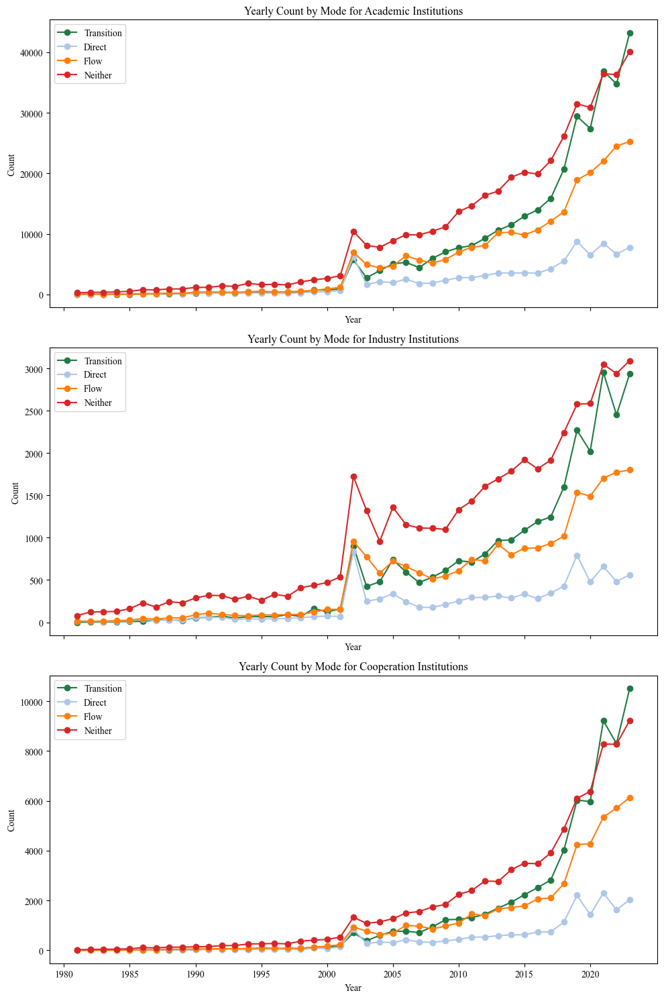

In [142]:
# 创建一个图形和多个子图
fig, axs = plt.subplots(3, 1, figsize=(10, 15), sharex=True)

# 机构类型列表
institution_types = ['academic', 'industry', 'cooperation']

# 颜色列表
colors = ['#1f7b42', '#aec7e8', '#ff7f0e', '#d62728']

for ax, institution in zip(axs, institution_types):
    years = list(range(1981, 2024))
    transition_counts = [transition_by_institution[year][institution] for year in years]
    direct_counts = [direct_by_institution[year][institution] for year in years]
    flow_counts = [flow_by_institution[year][institution] for year in years]
    neither_counts = [neither_by_institution[year][institution] for year in years]

    # 绘制折线图
    ax.plot(years, transition_counts, label='Transition', color=colors[0], marker='o')
    ax.plot(years, direct_counts, label='Direct', color=colors[1], marker='o')
    ax.plot(years, flow_counts, label='Flow', color=colors[2], marker='o')
    ax.plot(years, neither_counts, label='Neither', color=colors[3], marker='o')
    
    # 设置标题和标签
    ax.set_title(f'Yearly Count by Mode for {institution.capitalize()} Institutions')
    ax.set_ylabel('Count')
    ax.set_xlabel('Year')
    ax.legend(loc='upper left')

# 设置x轴标签
axs[-1].set_xticks(range(1980, 2025, 5))  # 假设你想要每5年一个刻度
axs[-1].set_xticklabels([f"{i}" for i in range(1980, 2025, 5)])

plt.tight_layout()
plt.show()

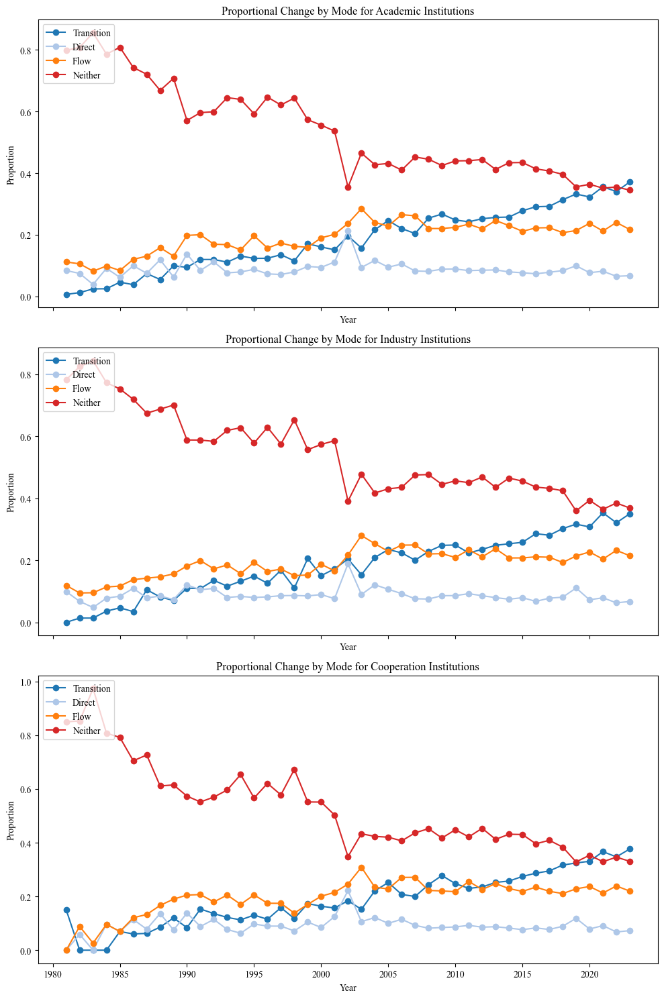

In [159]:
import matplotlib.pyplot as plt

# 创建一个图形和多个子图
fig, axs = plt.subplots(3, 1, figsize=(10, 15), sharex=True)

# 机构类型列表
institution_types = ['academic', 'industry', 'cooperation']

# 颜色列表
colors = ['#1f77b4', '#aec7e8', '#ff7f0e', '#d62728']

for ax, institution in zip(axs, institution_types):
    years = list(range(1981, 2024))
    transition_counts = [transition_by_institution[year][institution] for year in years]
    direct_counts = [direct_by_institution[year][institution] for year in years]
    flow_counts = [flow_by_institution[year][institution] for year in years]
    neither_counts = [neither_by_institution[year][institution] for year in years]

    # 计算每年的总计数
    total_counts = [transition + direct + flow + neither for transition, direct, flow, neither in zip(transition_counts, direct_counts, flow_counts, neither_counts)]

    # 计算每种模式的比例
    transition_ratios = [count / total if total > 0 else 0 for count, total in zip(transition_counts, total_counts)]
    direct_ratios = [count / total if total > 0 else 0 for count, total in zip(direct_counts, total_counts)]
    flow_ratios = [count / total if total > 0 else 0 for count, total in zip(flow_counts, total_counts)]
    neither_ratios = [count / total if total > 0 else 0 for count, total in zip(neither_counts, total_counts)]

    # 绘制折线图
    ax.plot(years, transition_ratios, label='Transition', color=colors[0], marker='o')
    ax.plot(years, direct_ratios, label='Direct', color=colors[1], marker='o')
    ax.plot(years, flow_ratios, label='Flow', color=colors[2], marker='o')
    ax.plot(years, neither_ratios, label='Neither', color=colors[3], marker='o')
    
    # 设置标题和标签
    ax.set_title(f'Proportional Change by Mode for {institution.capitalize()} Institutions')
    ax.set_ylabel('Proportion')
    ax.set_xlabel('Year')
    ax.legend(loc='upper left')

# 设置x轴标签
axs[-1].set_xticks(range(1980, 2025, 5))  # 假设你想要每5年一个刻度
axs[-1].set_xticklabels([f"{i}" for i in range(1980, 2025, 5)])

plt.tight_layout()
plt.show()

#### t 检验

In [194]:
def calculate_proportions(data_dicts):
    proportions = {inst: {form: [] for form in forms} for inst in institution_types}
    
    years = list(range(1981, 2024))
    
    for year in years:
        for inst in institution_types:
            # 计算当前机构类型在当前年的总和
            total = sum(data_dict[year][inst] for data_dict in data_dicts if year in data_dict and inst in data_dict[year])
            
            # 如果总和为0，跳过当前年份
            if total == 0:
                continue
            
            # 计算每种形式的比例
            for form, data_dict in zip(forms, data_dicts):
                if year in data_dict and inst in data_dict[year]:
                    count = data_dict[year][inst]
                    proportions[inst][form].append(count / total)
                else:
                    proportions[inst][form].append(0)  # 如果数据缺失，补充0
    return proportions

# 计算比例
proportions = calculate_proportions([transition_by_institution, direct_by_institution, flow_by_institution, neither_by_institution])

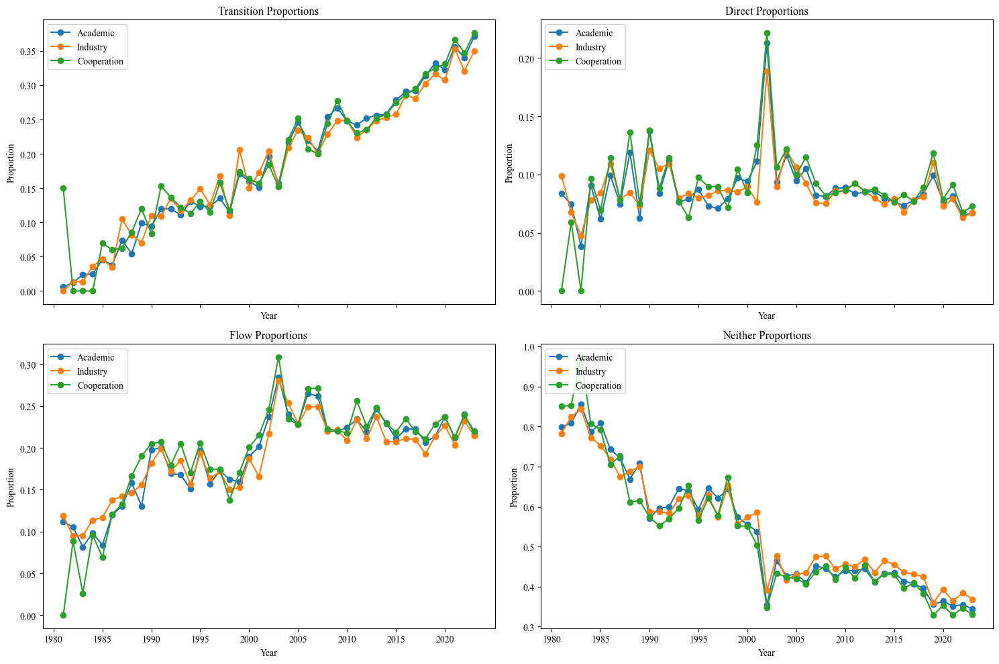

In [207]:
import matplotlib.pyplot as plt

# 设置图形
fig, axs = plt.subplots(2, 2, figsize=(15, 10), sharex=True)
axs = axs.flatten()  # 将二维数组展平为一维，方便迭代

# 颜色列表
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

# 绘制折线图
for ax, form in zip(axs, forms):
    for inst, color in zip(institution_types, colors):
        # 获取比例数据
        ratios = proportions[inst][form]
        years = list(range(1981, 2024))[:len(ratios)]  # 确保年份和数据长度一致
        
        # 绘制折线图
        ax.plot(years, ratios, label=f'{inst.capitalize()}', color=color, marker='o')
    
    # 设置标题和标签
    ax.set_title(f'{form.capitalize()} Proportions')
    ax.set_ylabel('Proportion')
    ax.set_xlabel('Year')
    ax.legend(loc='upper left')
    ax.set_xticks(range(1980, 2025, 5))  # 每5年一个刻度
    ax.set_xticklabels([f"{i}" for i in range(1980, 2025, 5)])

plt.tight_layout()
plt.show()

In [197]:
import scipy.stats as stats

forms = ['transition', 'direct', 'flow', 'neither']
t_test_results = {form: {} for form in forms}

for form in forms:
    academic_data = proportions['academic'][form]
    industry_data = proportions['industry'][form]
    cooperation_data = proportions['cooperation'][form]
    
    # 进行t检验
    t_test_results[form]['academic_vs_industry'] = stats.ttest_ind(academic_data, industry_data)
    t_test_results[form]['academic_vs_cooperation'] = stats.ttest_ind(academic_data, cooperation_data)
    t_test_results[form]['industry_vs_cooperation'] = stats.ttest_ind(industry_data, cooperation_data)

In [201]:
t_test_results

{'transition': {'academic_vs_industry': TtestResult(statistic=0.07827825700347947, pvalue=0.9377928809332543, df=84.0),
  'academic_vs_cooperation': TtestResult(statistic=-0.21885154315886257, pvalue=0.8272965655034671, df=84.0),
  'industry_vs_cooperation': TtestResult(statistic=-0.3059748996212908, pvalue=0.7603807983854172, df=84.0)},
 'direct': {'academic_vs_industry': TtestResult(statistic=0.20838739762725825, pvalue=0.8354309561829071, df=84.0),
  'academic_vs_cooperation': TtestResult(statistic=-0.2904262304859556, pvalue=0.7722059769174072, df=84.0),
  'industry_vs_cooperation': TtestResult(statistic=-0.4836938089217897, pvalue=0.6298617415613066, df=84.0)},
 'flow': {'academic_vs_industry': TtestResult(statistic=0.23993961761518118, pvalue=0.810961624385514, df=84.0),
  'academic_vs_cooperation': TtestResult(statistic=-0.18615555231199712, pvalue=0.8527716012327965, df=84.0),
  'industry_vs_cooperation': TtestResult(statistic=-0.40520915125390916, pvalue=0.6863539340366696, df

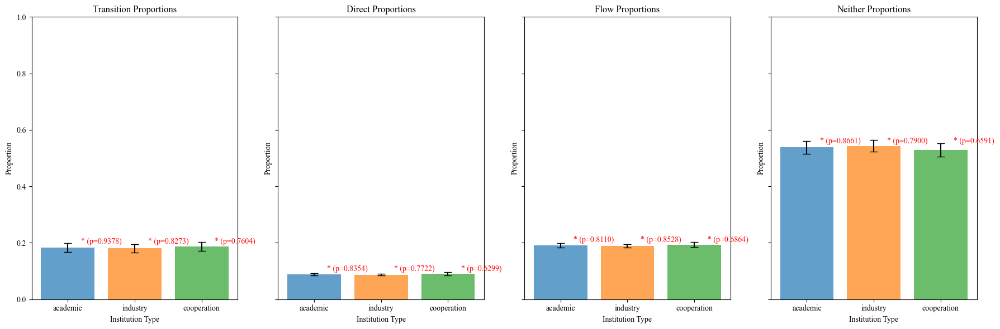

In [200]:
import matplotlib.pyplot as plt
import numpy as np

# 设置图形
fig, axs = plt.subplots(1, len(forms), figsize=(18, 6), sharey=True)
institution_types = ['academic', 'industry', 'cooperation']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

# 绘制柱状图
for ax, form in zip(axs, forms):
    means = [np.mean(proportions[inst][form]) for inst in institution_types]
    sems = [stats.sem(proportions[inst][form]) for inst in institution_types]
    
    bars = ax.bar(institution_types, means, yerr=sems, color=colors, capsize=5, alpha=0.7)
    
    # 添加显著性注释
    for i, comparison in enumerate(t_test_results[form].keys()):
        p_value = t_test_results[form][comparison].pvalue
        if p_value < 0.05:
            ax.text(i + 0.5, max(means) + 0.01, f"* (p={p_value:.4f})", ha='center', fontsize=10, color='red')
    
    ax.set_title(f'{form.capitalize()} Proportions')
    ax.set_ylabel('Proportion')
    ax.set_xlabel('Institution Type')
    ax.set_ylim(0, 1)

plt.tight_layout()
plt.show()

In [206]:
means

[0.5377024679431098, 0.5429440936294825, 0.5286953379806145]

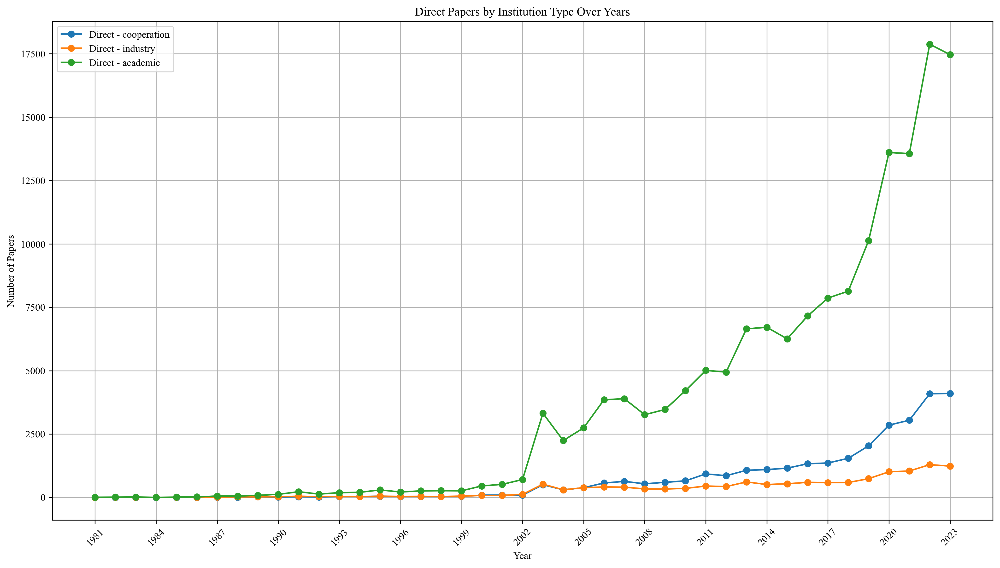

In [99]:
import matplotlib.pyplot as plt

# 提取年份范围
years = sorted(flow_by_institution.keys())

# 绘制折线图
plt.figure(figsize=(14, 8), dpi=300)

# 遍历机构类型并绘制
institution_types = set()
for year_data in flow_by_institution.values():
    institution_types.update(year_data.keys())


# 绘制 direct 类型的论文数量
for institution in institution_types:
    counts = [flow_by_institution[year].get(institution, 0) for year in years]
    plt.plot(years, counts, marker='o', label=f"Direct - {institution}")

# 添加图例和标签
plt.xlabel('Year')
plt.ylabel('Number of Papers')
plt.title('Direct Papers by Institution Type Over Years')
plt.legend()
plt.grid(True)
plt.xticks(years[::3], rotation=45)
plt.tight_layout()
plt.show()

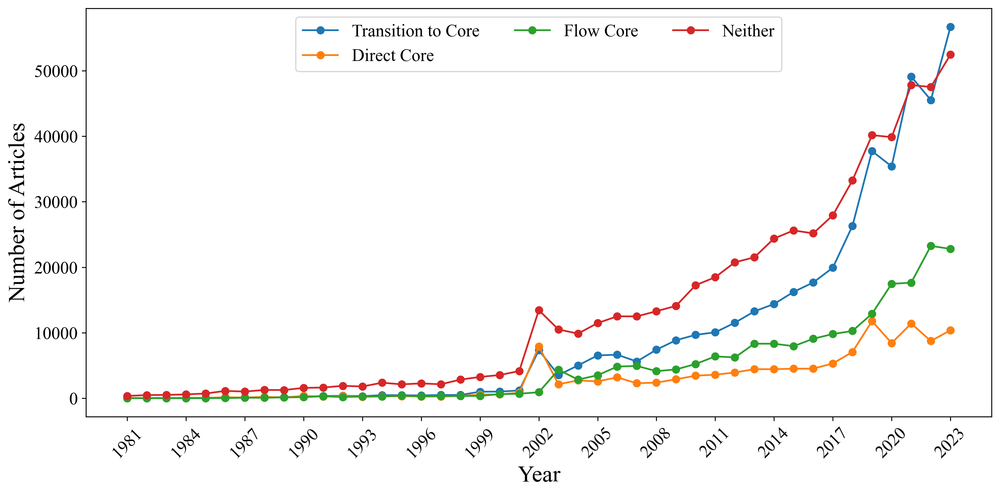

In [101]:
years = sorted(set(transition_results_by_year.keys()).union(direct_results_by_year.keys()))
transition_counts = [len(transition_results_by_year.get(year, [])) for year in years]
direct_counts = [len(direct_results_by_year.get(year, [])) for year in years]
flow_counts = [len(flow_results_by_year.get(year, [])) for year in years]
neither_counts = [len(neither_results_by_year.get(year, [])) for year in years]

# 绘制折线图
plt.figure(figsize=(12, 6),dpi=300)
plt.plot(years, transition_counts, label='Transition to Core', marker='o')
plt.plot(years, direct_counts, label='Direct Core', marker='o')
plt.plot(years, flow_counts, label='Flow Core', marker='o')
plt.plot(years, neither_counts, label='Neither', marker='o')

# 添加标题和标签
# plt.title('Number of Articles Matching Transition to Core and Direct Core Over Years')
plt.xlabel('Year',fontsize=20)
plt.ylabel('Number of Articles',fontsize=20)
plt.xticks(years[::3], rotation=45,fontsize=15)  # 旋转 x 轴标签以便更好地显示
plt.yticks(fontsize=15)  # 旋转 x 轴标签以便更好地显示
# 设置图例居中
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.0), ncol=3, fontsize=15)
plt.grid(False)
plt.tight_layout()

# 显示图表
plt.show()

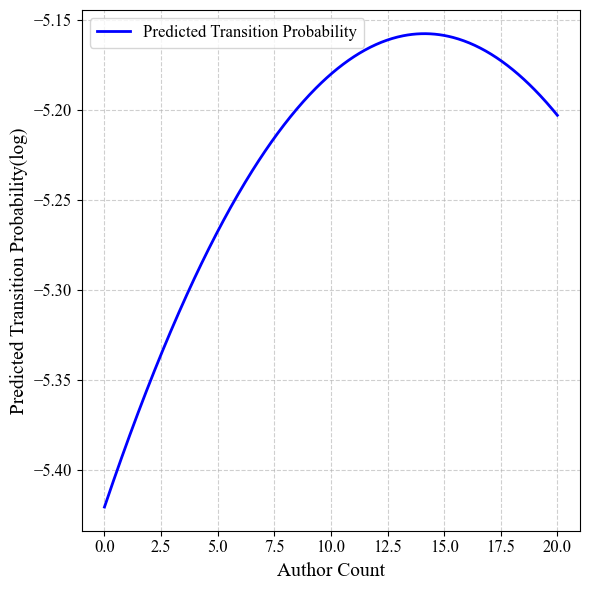

In [32]:
beta_constant = -5.420343
beta_author_count = 0.0371851
beta_author_counts_sq = -0.0013156

# 生成作者数量的范围
author_counts = np.linspace(0, 20, 500)  # 假设作者数量从 0 到 100

# 计算预测值
predicted_values = beta_constant + beta_author_count * author_counts + beta_author_counts_sq * author_counts**2

# 绘制倒U型曲线
plt.figure(figsize=(6, 6),dpi=100)
plt.plot(author_counts, predicted_values, label='Predicted Transition Probability', color='blue', linewidth=2)

# 添加标题和标签
# plt.title('Inverse U-shaped Relationship between Author Count and Transition Probability', fontsize=16)
plt.xlabel('Author Count', fontsize=14)
plt.ylabel('Predicted Transition Probability(log)', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

# 添加网格线
plt.grid(True, linestyle='--', alpha=0.6)

# 显示图表
plt.tight_layout()
plt.show()

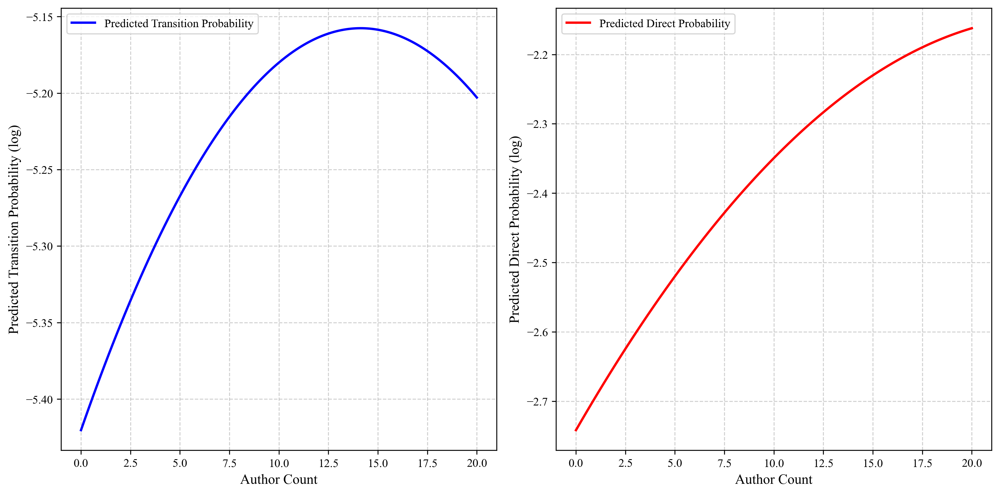

In [35]:
import numpy as np
import matplotlib.pyplot as plt

# 模型1的回归系数
beta_constant1 = -5.420343
beta_author_count1 = 0.0371851
beta_author_counts_sq1 = -0.0013156

# 模型2的回归系数
beta_constant2 = -2.741743
beta_author_count2 = 0.0494918
beta_author_counts_sq2 = -0.0010256

# 生成作者数量的范围
author_counts = np.linspace(0, 20, 500)  # 假设作者数量从 0 到 20

# 计算两个模型的预测值
predicted_values1 = beta_constant1 + beta_author_count1 * author_counts + beta_author_counts_sq1 * author_counts**2
predicted_values2 = beta_constant2 + beta_author_count2 * author_counts + beta_author_counts_sq2 * author_counts**2

# 创建一个图形窗口
plt.figure(figsize=(12, 6), dpi=300)

# 子图1：第一个模型
plt.subplot(1, 2, 1)  # 1行2列的第1个
plt.plot(author_counts, predicted_values1, label='Predicted Transition Probability', color='blue', linewidth=2)
plt.xlabel('Author Count', fontsize=12)
plt.ylabel('Predicted Transition Probability (log)', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)

# 子图2：第二个模型
plt.subplot(1, 2, 2)  # 1行2列的第2个
plt.plot(author_counts, predicted_values2, label='Predicted Direct Probability', color='red', linewidth=2)
plt.xlabel('Author Count', fontsize=12)
plt.ylabel('Predicted Direct Probability (log)', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)

# 调整布局
plt.tight_layout()

# 显示图表
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 回归系数
beta_constant = -0.5  # 假设的常数项，需要根据实际回归结果调整
beta_author_count = 0.0371851
beta_author_counts_sq = -0.0013156

# 生成作者数量的范围
author_counts = np.linspace(0, 20, 500)  # 假设作者数量从 0 到 100

# 计算预测值
predicted_values = beta_constant + beta_author_count * author_counts + beta_author_counts_sq * author_counts**2

# 绘制倒U型曲线
plt.figure(figsize=(10, 6))
plt.plot(author_counts, predicted_values, label='Predicted Transition Probability', color='blue', linewidth=2)

# 添加标题和标签
# plt.title('Inverse U-shaped Relationship between Author Count and Transition Probability', fontsize=16)
plt.xlabel('Author Count', fontsize=14)
plt.ylabel('Predicted Transition Probability', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)

# 添加网格线
plt.grid(True, linestyle='--', alpha=0.6)

# 显示图表
plt.tight_layout()
plt.show()

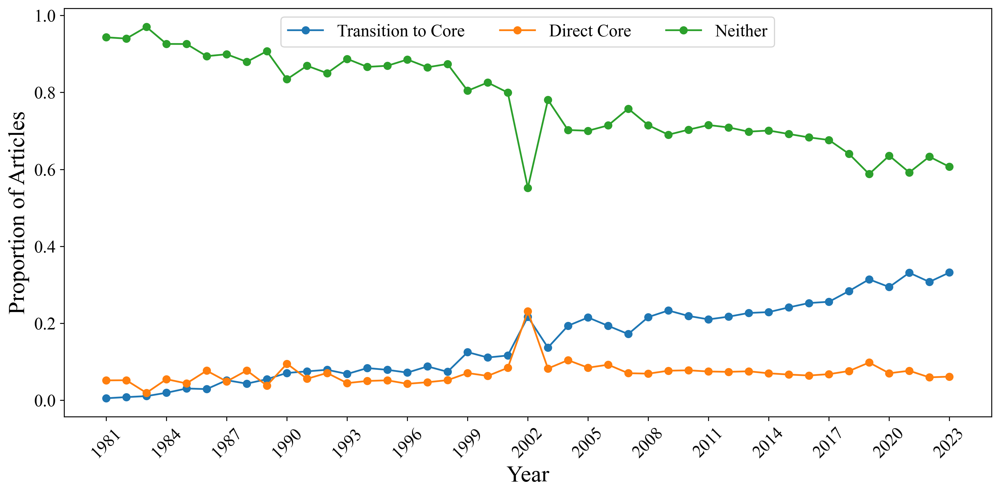

In [21]:
# 计算每年每种类别的占比
transition_proportions = []
direct_proportions = []
neither_proportions = []

for year in years:
    total_count = len(transition_results_by_year.get(year, [])) + \
                  len(direct_results_by_year.get(year, [])) + \
                  len(neither_results_by_year.get(year, []))
    
    if total_count > 0:
        transition_proportions.append(len(transition_results_by_year.get(year, [])) / total_count)
        direct_proportions.append(len(direct_results_by_year.get(year, [])) / total_count)
        neither_proportions.append(len(neither_results_by_year.get(year, [])) / total_count)
    else:
        transition_proportions.append(0)
        direct_proportions.append(0)
        neither_proportions.append(0)

# 绘制折线图
plt.figure(figsize=(12, 6), dpi=300)
plt.plot(years, transition_proportions, label='Transition to Core', marker='o')
plt.plot(years, direct_proportions, label='Direct Core', marker='o')
plt.plot(years, neither_proportions, label='Neither', marker='o')

# 添加标题和标签
plt.xlabel('Year', fontsize=20)
plt.ylabel('Proportion of Articles', fontsize=20)
plt.xticks(years[::3], rotation=45, fontsize=15)  # 旋转 x 轴标签以便更好地显示
plt.yticks(fontsize=15)  # 设置纵坐标字体大小
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.0), ncol=3, fontsize=15)
plt.grid(False)
plt.tight_layout()

# 显示图表
plt.show()

In [190]:
filter_ai_papers

{'W2079817815': {'title': '<i>ftd</i>',
  'publication_year': 1998,
  'authorships': [{'author_name': 'Ying Liu',
    'author_id': 'A5100778012',
    'institution_name': 'Carnegie Mellon University',
    'institution_type': 'education',
    'institution_country': 'US'},
   {'author_name': 'Lawrence T. Pileggi',
    'author_id': 'A5004024474',
    'institution_name': 'Carnegie Mellon University',
    'institution_type': 'education',
    'institution_country': 'US'},
   {'author_name': 'Andrzej J. Strojwas',
    'author_id': 'A5008759589',
    'institution_name': 'Carnegie Mellon University',
    'institution_type': 'education',
    'institution_country': 'US'}],
  'concepts': ['Computer science',
   'Algorithm',
   'Mathematics',
   'Artificial intelligence',
   'Mathematical analysis',
   'Statistics',
   'Computer hardware',
   'Computer vision'],
  'abstract': 'Recursive convolution provides an exact solution for interfacing reduced-order frequency domain representations with discret

100%|██████████| 1377520/1377520 [00:00<00:00, 2075148.96it/s]


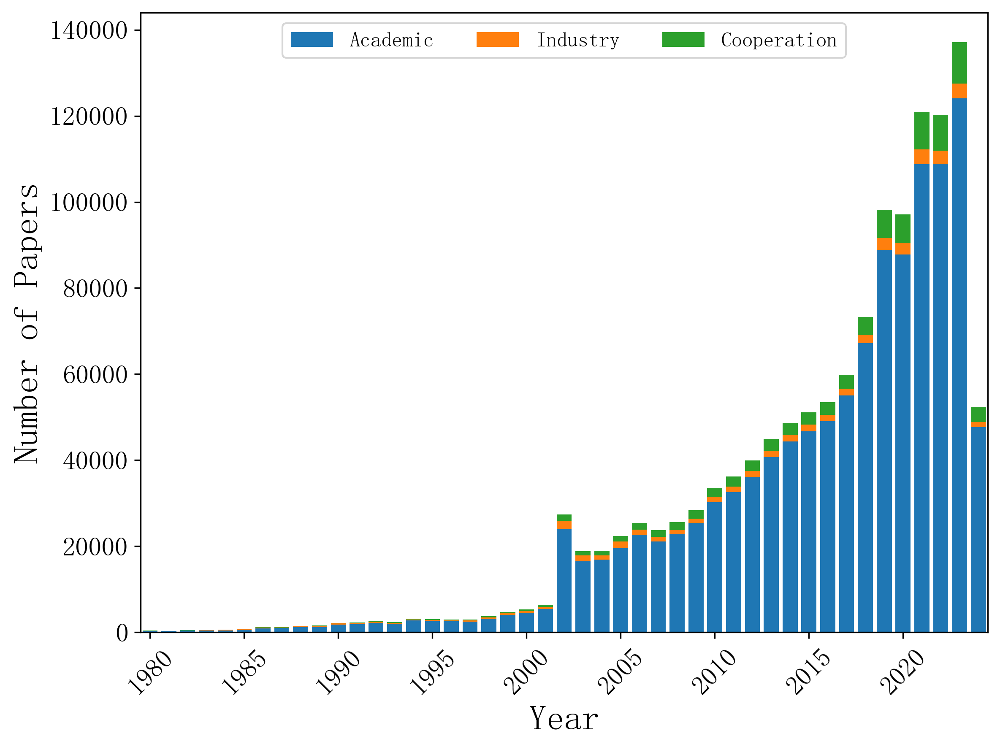

In [21]:
# 初始化统计字典
category_distribution_by_year = defaultdict(lambda: defaultdict(int))

# 遍历每篇论文
for record_id, record in tqdm(filter_ai_papers.items()):
    publication_year = record.get("publication_year", 0)
    if publication_year < 1980 or publication_year > 2024:
        continue

    # 将分类结果存储回 ai_papers 数据结构中
    category = record['category']

    # 统计每年每种分类的数量
    category_distribution_by_year[publication_year][category] += 1

# 准备绘图数据
years = sorted(category_distribution_by_year.keys())
categories = ['academic', 'industry', 'cooperation']

# 初始化每年每种分类的数量列表
category_counts = {cat: [] for cat in categories}

# 填充数据
for year in years:
    total_papers = sum(category_distribution_by_year[year].values())
    for category in categories:
        count = category_distribution_by_year[year][category]
        category_counts[category].append(count)

# 绘制堆叠图
plt.figure(figsize=(8, 6),dpi=300)
bottoms = [0] * len(years)  # 初始化堆叠的底部位置

for category in categories:
    plt.bar(years, category_counts[category], bottom=bottoms, label=category.capitalize())
    bottoms = [bottoms[i] + category_counts[category][i] for i in range(len(years))]

plt.xlim(min(years)-0.5, max(years)+.5)

plt.xlabel('Year',fontsize=20)
plt.ylabel('Number of Papers',fontsize=20)
plt.xticks(years[::5], rotation=45, fontsize=15)
plt.yticks(fontsize=15)  # 设置纵坐标字体大小

# 设置图例居中
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.0), ncol=len(categories), fontsize=12)
plt.grid(False)
plt.tight_layout()
plt.show()

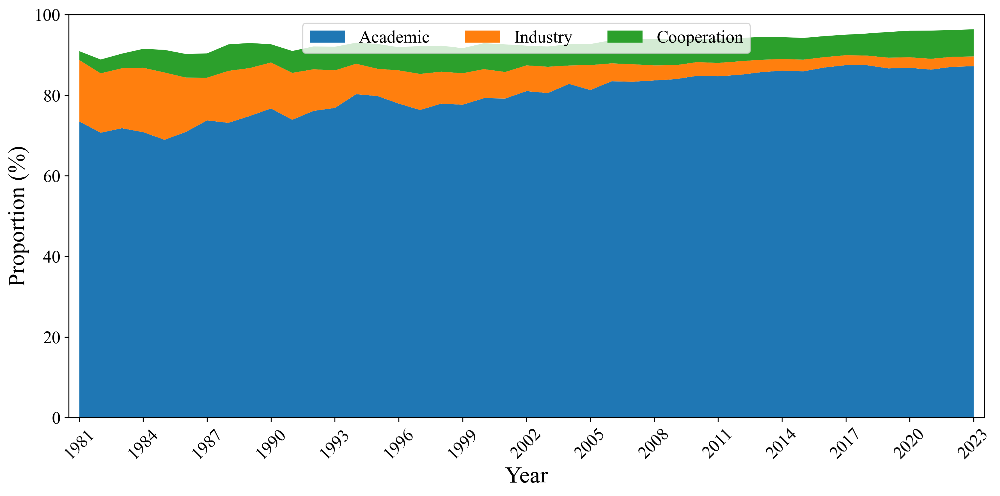

In [16]:
# 初始化每年每种分类的比例列表
category_proportions = {cat: [] for cat in categories}

# 填充数据并计算比例
for year in years:
    total_papers = sum(category_distribution_by_year[year].values())
    for category in categories:
        count = category_distribution_by_year[year][category]
        proportion = (count / total_papers) * 100 if total_papers > 0 else 0
        category_proportions[category].append(proportion)

# 绘制堆叠折线图
plt.figure(figsize=(12, 6), dpi=300)
bottoms = [0] * len(years)  # 初始化堆叠的底部位置

for category in categories:
    plt.fill_between(years, bottoms, [bottoms[i] + category_proportions[category][i] for i in range(len(years))],
                     label=category.capitalize())
    bottoms = [bottoms[i] + category_proportions[category][i] for i in range(len(years))]

# 调整坐标轴范围
plt.xlim(min(years)-0.5, max(years)+0.5)
plt.ylim(0, 100)  # 比例范围为 0% 到 100%

plt.xlabel('Year',fontsize=20)
plt.ylabel('Proportion (%)',fontsize=20)
plt.xticks(years[::3], rotation=45, fontsize=15)
plt.yticks(fontsize=15)  # 设置纵坐标字体大小

# 设置图例居中
plt.legend(loc='upper center', bbox_to_anchor=(0.5, 1.0), ncol=len(categories), fontsize=15)
plt.grid(False)
plt.tight_layout()
plt.show()

#### Stata

In [88]:
filtered_ai_papers['W2079817815']['sub concepts']

['Computer Vision']

In [89]:
import pandas as pd
from tqdm import tqdm

# 创建一个 DataFrame 来存储每篇论文的信息
columns = [
    'record_id', 'publication_year', 
    'transition', 'direct', 'flow', 'neither', 
    'academic', 'industry', 'cooperation', 
    'author_count', 'country_count', 'institution_count',
    'disruptiveness', 'novelty', 'c5', 'sub_concept'  # 修改字段名为 'sub_concept'
]
data = []

# 遍历每篇论文并提取所需信息
for record_id, record in tqdm(filtered_ai_papers.items()):
    publication_year = record.get("publication_year", 0)
    if publication_year <= 1980 or publication_year >= 2024:
        continue

    # 获取论文的分类
    if record_id in flow_results_by_year[publication_year]:
        flow = 1
    else:
        flow = 0
    if record_id in transition_results_by_year[publication_year]:
        category = 'transition'
    elif record_id in direct_results_by_year[publication_year]:
        category = 'direct'
    elif record_id in neither_results_by_year[publication_year]:
        category = 'neither'
    else:
        continue

    # 获取作者信息
    authorships = record.get('authorships', [])
    author_count = len(authorships)
    institution_type = classify_institution_type(authorships)
    disruptiveness = record.get('disruptiveness', None)
    novelty = record.get('novelty', None)
    c5 = record.get('c5', None)

    # 获取具体子类别信息
    sub_concepts = record.get('sub concepts', [])
    sub_concept = sub_concepts[0] if sub_concepts else None  # 取第一个子类别，如果存在

    # 统计国家数量和机构数量
    counts = count_countries_and_institutions(authorships)

    # 创建虚拟变量
    category_dummies = {
        'transition': 1 if category == 'transition' else 0,
        'direct': 1 if category == 'direct' else 0,
        'neither': 1 if category == 'neither' else 0
    }
    institution_dummies = {
        'academic': 1 if institution_type == 'academic' else 0,
        'industry': 1 if institution_type == 'industry' else 0,
        'cooperation': 1 if institution_type == 'cooperation' else 0,
    }

    # 添加到数据列表
    data.append([
        record_id, 
        publication_year, 
        category_dummies['transition'], 
        category_dummies['direct'],
        flow,
        category_dummies['neither'], 
        institution_dummies['academic'], 
        institution_dummies['industry'], 
        institution_dummies['cooperation'], 
        author_count, 
        counts['country_count'], 
        counts['institution_count'],
        disruptiveness,
        novelty,
        c5,
        sub_concept  # 添加第一个子类别
    ])

# 创建 DataFrame
df = pd.DataFrame(data, columns=columns)

# 导出为 CSV 文件
output_file = './data/filtered_ai_papers.csv'
df.to_csv(output_file, index=False)

print(f"Filtered data has been saved to {output_file}")

100%|██████████| 1055544/1055544 [00:04<00:00, 261818.62it/s]


Filtered data has been saved to ./data/filtered_ai_papers.csv


In [60]:
from collections import defaultdict
from tqdm import tqdm

# 初始化统计字典
category_counts = {
    'transition': defaultdict(int),
    'direct': defaultdict(int),
    'neither': defaultdict(int)
}

# 处理 transition_results_by_year
for year, record_ids in tqdm(transition_results_by_year.items(), desc="Processing Transition Results"):
    for record_id in record_ids:
        record = ai_papers.get(record_id)
        if record:
            category = record.get('category', 'unknown')
            category_counts['transition'][category] += 1

# 处理 direct_results_by_year
for year, record_ids in tqdm(direct_results_by_year.items(), desc="Processing Direct Results"):
    for record_id in record_ids:
        record = ai_papers.get(record_id)
        if record:
            category = record.get('category', 'unknown')
            category_counts['direct'][category] += 1

# 处理 neither_results_by_year
for year, record_ids in tqdm(neither_results_by_year.items(), desc="Processing Neither Results"):
    for record_id in record_ids:
        record = ai_papers.get(record_id)
        if record:
            category = record.get('category', 'unknown')
            category_counts['neither'][category] += 1

Processing Neither Results: 100%|██████████| 43/43 [00:00<00:00, 57.79it/s]


In [62]:
# 打印统计结果
for category, counts in category_counts.items():
    total = sum(counts.values())
    print(f"\n{category.capitalize()} Results:")
    for category_type, count in counts.items():
        print(f"{category_type.capitalize()}: {count} ({count / total:.2%})")


Transition Results:
Academic: 369374 (83.47%)
Industry: 14101 (3.19%)
Cooperation: 39825 (9.00%)
Other: 19244 (4.35%)

Direct Results:
Academic: 106805 (82.22%)
Cooperation: 11835 (9.11%)
Other: 6348 (4.89%)
Industry: 4918 (3.79%)

Neither Results:
Cooperation: 84775 (7.44%)
Academic: 945818 (82.96%)
Industry: 35952 (3.15%)
Other: 73609 (6.46%)


In [63]:
import numpy as np
from scipy.stats import chi2_contingency
from collections import defaultdict
from tqdm import tqdm

# 准备卡方检验的数据
categories = ['academic', 'industry', 'cooperation', 'other']
contingency_table = np.array([
    [category_counts['transition'][cat] for cat in categories],
    [category_counts['direct'][cat] for cat in categories],
    [category_counts['neither'][cat] for cat in categories]
])

# 进行卡方检验
chi2, p, dof, expected = chi2_contingency(contingency_table)

# 打印卡方检验结果
print("\nChi-Square Test Results:")
print(f"Chi-Square Statistic: {chi2:.4f}")
print(f"P-value: {p:.4f}")
print(f"Degrees of Freedom: {dof}")
print(f"Expected Frequencies:\n{expected}")

# 判断是否有统计学差异
if p < 0.05:
    print("There is a statistically significant difference in the distribution of institution types across the three categories.")
else:
    print("There is no statistically significant difference in the distribution of institution types across the three categories.")


Chi-Square Test Results:
Chi-Square Statistic: 4020.8302
P-value: 0.0000
Degrees of Freedom: 6
Expected Frequencies:
[[367449.94194104  14204.73514251  35255.37172633  25633.95119012]
 [107862.61288774   4169.71040941  10348.99200866   7524.68469418]
 [946684.44517121  36596.55444808  90830.63626501  66042.3641157 ]]
There is a statistically significant difference in the distribution of institution types across the three categories.


In [44]:
# 初始化作者数量统计字典
transition_authors_by_year = defaultdict(list)
direct_authors_by_year = defaultdict(list)
neither_authors_by_year = defaultdict(list)

# 遍历每种模式的结果，统计每年的作者数量
def calculate_average_authors(results_by_year, authors_by_year):
    for year, record_ids in results_by_year.items():
        for record_id in record_ids:
            record = ai_papers.get(record_id)
            if record:
                authors_count = len(record.get('authorships', []))
                if authors_count > 0:
                    authors_by_year[year].append(authors_count)

# 计算 transition_to_core 模式的作者数量
calculate_average_authors(transition_results_by_year, transition_authors_by_year)

# 计算 direct_core 模式的作者数量
calculate_average_authors(direct_results_by_year, direct_authors_by_year)

# 计算 neither 模式的作者数量
calculate_average_authors(neither_results_by_year, neither_authors_by_year)

# 计算每年每种模式的平均作者数量
average_authors_by_year = {
    "transition": {year: sum(counts) / len(counts) for year, counts in transition_authors_by_year.items() if counts},
    "direct": {year: sum(counts) / len(counts) for year, counts in direct_authors_by_year.items() if counts},
    "neither": {year: sum(counts) / len(counts) for year, counts in neither_authors_by_year.items() if counts}
}

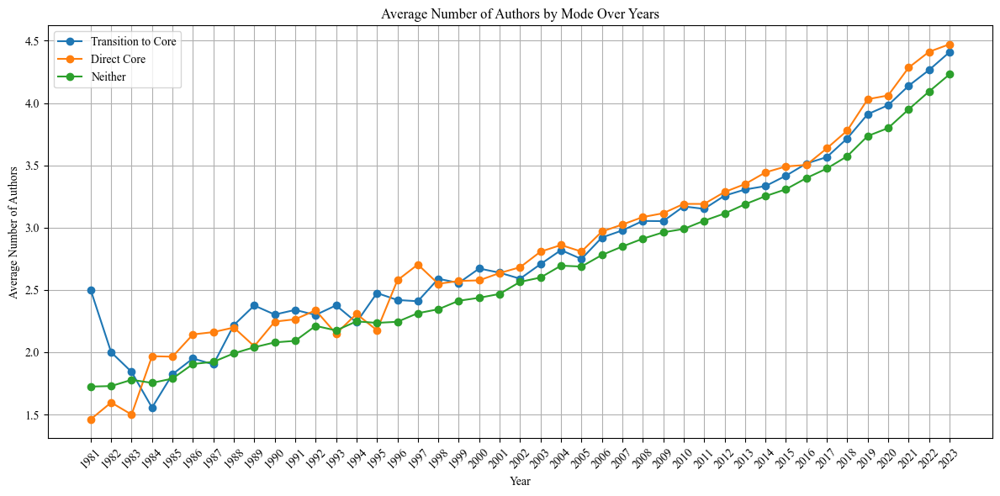

In [45]:
years = sorted(set(average_authors_by_year["transition"].keys()).union(
               average_authors_by_year["direct"].keys()).union(
               average_authors_by_year["neither"].keys()))

transition_averages = [average_authors_by_year["transition"].get(year, 0) for year in years]
direct_averages = [average_authors_by_year["direct"].get(year, 0) for year in years]
neither_averages = [average_authors_by_year["neither"].get(year, 0) for year in years]

plt.figure(figsize=(12, 6))
plt.plot(years, transition_averages, label='Transition to Core', marker='o')
plt.plot(years, direct_averages, label='Direct Core', marker='o')
plt.plot(years, neither_averages, label='Neither', marker='o')

plt.title('Average Number of Authors by Mode Over Years')
plt.xlabel('Year')
plt.ylabel('Average Number of Authors')
plt.xticks(years, rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [50]:
ai_papers['W2079817815']['authorships']

[{'author_name': 'Ying Liu',
  'author_id': 'A5100778012',
  'institution_name': 'Carnegie Mellon University',
  'institution_type': 'education',
  'institution_country': 'US'},
 {'author_name': 'Lawrence T. Pileggi',
  'author_id': 'A5004024474',
  'institution_name': 'Carnegie Mellon University',
  'institution_type': 'education',
  'institution_country': 'US'},
 {'author_name': 'Andrzej J. Strojwas',
  'author_id': 'A5008759589',
  'institution_name': 'Carnegie Mellon University',
  'institution_type': 'education',
  'institution_country': 'US'}]

In [23]:
direct_core

{1981: {'altmetric',
  'apl',
  'compil',
  'comput system',
  'crossref',
  'decisionmak',
  'decision‐mak effect',
  'ealert',
  'general social survey',
  'inform flow process',
  'natur languag text',
  'simul model',
  'spss program'},
 1982: {'adpcm',
  'arm filter',
  'bit rate',
  'comput complex',
  'design techniqu',
  'english',
  'filter bank',
  'inform retriev system',
  'm sigplansigact symposium',
  'natur languag process',
  'recal',
  'speech',
  'speech compress system',
  'voiceband data',
  'word process'},
 1983: {'dss', 'inform retriev', 'par'},
 1984: {'accuraci',
  'acquisit time',
  'adapt filter',
  'arab',
  'communic secur',
  'control strategi',
  'dfe',
  'educ',
  'french',
  'generat',
  'imag',
  'interpret process',
  'japane',
  'model process',
  'natur languag processor',
  'parser',
  'scrambler',
  'secur speech communic',
  'sen',
  'signal recoveri'},
 1985: {'acm sigir confer',
  'advertis return',
  'cluster algorithm',
  'comput graphic',
  

In [98]:
with open('./data/transition_to_core.pickle', 'wb') as f:
    pickle.dump(transition_to_core,f)
with open('./data/direct_core.pickle', 'wb') as f:
    pickle.dump(direct_core,f)

In [14]:
import pandas as pd

# 创建 Excel writer
with pd.ExcelWriter("./core-periphery/core_transitions.xlsx", engine="xlsxwriter") as writer:
    for year in tqdm(transition_to_core.keys()):
        # 获取 transition_to_core 和 direct_core 的实体
        transition_entities = list(transition_to_core[year])
        direct_core_entities = list(direct_core[year])

        # 构造 transition_to_core DataFrame
        transition_data = []
        for entity in transition_entities:
            entity_type = entity_to_dominant_label_map.get(entity, "Unknown")  # 获取实体类别
            frequency = entity_counter.get(entity, 0)  # 获取实体频次
            if frequency >= 10 and entity_type != 'OtherScientificTerm':  # 过滤掉频次小于 10 的实体
                transition_data.append((entity, entity_type, frequency))

        # 构造 direct_core DataFrame
        direct_core_data = []
        for entity in direct_core_entities:
            entity_type = entity_to_dominant_label_map.get(entity, "Unknown")  # 获取实体类别
            frequency = entity_counter.get(entity, 0)  # 获取实体频次
            if frequency >= 10 and entity_type != 'OtherScientificTerm':  # 过滤掉频次小于 10 的实体
                direct_core_data.append((entity, entity_type, frequency))

        # **转换为 DataFrame 并确保按频次降序排序**
        df_transition = pd.DataFrame(transition_data, columns=["Entity", "Category", "Frequency"])
        df_transition = df_transition.sort_values(by="Frequency", ascending=False).reset_index(drop=True)

        df_direct_core = pd.DataFrame(direct_core_data, columns=["Entity", "Category", "Frequency"])
        df_direct_core = df_direct_core.sort_values(by="Frequency", ascending=False).reset_index(drop=True)

        # 让两张表纵向对齐（填充 NaN 让它们一样长）
        max_len = max(len(df_transition), len(df_direct_core))
        df_transition = df_transition.reindex(list(range(max_len))).reset_index(drop=True)
        df_direct_core = df_direct_core.reindex(list(range(max_len))).reset_index(drop=True)

        # **合并两张表，保持排序不变**
        df_combined = pd.concat([df_transition, df_direct_core], axis=1)
        df_combined.columns = ["Trans_Entity", "Trans_Category", "Trans_Frequency", 
                               "Direct_Entity", "Direct_Category", "Direct_Frequency"]

        # 写入 Excel，每年一个 sheet
        df_combined.to_excel(writer, sheet_name=str(year), index=False)

        # **设置列宽**
        workbook = writer.book
        worksheet = writer.sheets[str(year)]
        worksheet.set_column("A:A", 30)  # Trans_Entity 列宽
        worksheet.set_column("B:B", 20)  # Trans_Category 列宽
        worksheet.set_column("C:C", 12)  # Trans_Frequency 列宽
        worksheet.set_column("D:D", 30)  # Direct_Entity 列宽
        worksheet.set_column("E:E", 20)  # Direct_Category 列宽
        worksheet.set_column("F:F", 12)  # Direct_Frequency 列宽

print("Excel 文件已保存，列宽已调整，频次已正确排序！")

100%|██████████| 43/43 [00:01<00:00, 23.41it/s] 


Excel 文件已保存，列宽已调整，频次已正确排序！


In [83]:
stem_text("bidirectional encoder representation from transformer")

'bidirect encod represent from transform'

In [86]:
'bidirect encod represent from transform' in direct_core[2019]

True

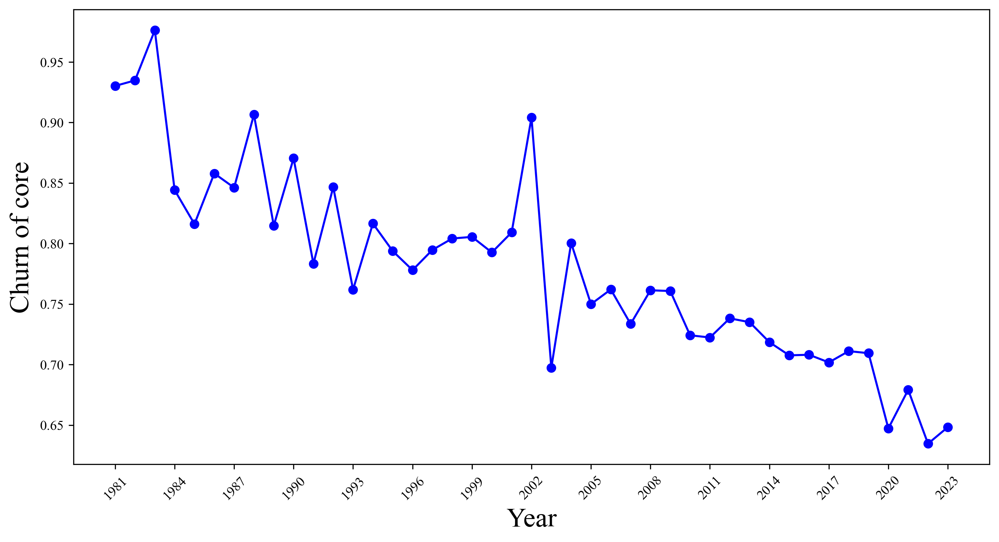

In [43]:
# 按年份排序
sorted_years = sorted(cit_values.keys())
sorted_cit = [cit_values[year] for year in sorted_years]

# 绘制折线图
plt.figure(figsize=(12, 6),dpi=300)
plt.plot(sorted_years, sorted_cit, marker='o', linestyle='-', color='blue')
plt.xlabel('Year',fontsize=20)
plt.ylabel('Churn of core',fontsize=20)
plt.xticks(sorted_years[::3], rotation=45)  # 每隔三年显示一次，并将标签旋转45度
plt.show()

#### 加载颠覆性cd5 dict

In [96]:
import csv

tsv_file = r'E:\tinierZhao\sciERC\SciSciNet-CD5\SciSciNet_Paper_CD5.tsv'
cd5_dict = {}

with open(tsv_file, mode='r', newline='', encoding='utf-8') as file:
    reader = csv.reader(file, delimiter='\t')  # 指定制表符作为分隔符
    for row in reader:
        if len(row) == 2:  # 确保每行有两个元素
            key, value = row
            cd5_dict[key] = value